# House Price Prediction

## Dataset Preview
*House Price Prediction: Comprehensive Exploratory Data Analysis (EDA)* <br>
Training set 1460 Samples <br>
Testing set  1459 Samples

In [4]:
# =============================================================================
# 1. SETUP AND DATA LOADING (您的原始代码)
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, skew

# Set visualization style
sns.set_style("whitegrid")
# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# File paths provided by the user
# 注意：请确保这里的路径对您的系统是正确的
train_path = '/home/haoqian/HousePricePrediction/data/train.csv'
test_path = '/home/haoqian/HousePricePrediction/data/test.csv'

# Load the datasets
try:
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    print("Data loaded successfully.")
    print(f"Training data shape: {df_train.shape}")
    print(f"Testing data shape: {df_test.shape}")
except FileNotFoundError:
    print(f"Error: The file path '{train_path}' or '{test_path}' was not found.")
    print("Please ensure the CSV files are in the correct directory.")
    # Exit if data cannot be loaded
    exit()

# Store the ID columns and then drop them from the training data for analysis
train_ID = df_train['Id']
test_ID = df_test['Id']
df_train.drop("Id", axis=1, inplace=True)
df_test.drop("Id", axis=1, inplace=True)

# =============================================================================
# 2. MISSING VALUE ANALYSIS & CSV EXPORT (新增部分)
# =============================================================================
print("\nAnalyzing missing values for both training and testing datasets...")

# --- Step 1: Calculate missing values for the training set ---
missing_train_count = df_train.isnull().sum()
missing_train_percent = (missing_train_count / len(df_train)) * 100
# 创建一个包含训练集缺失值信息的DataFrame
missing_train_df = pd.DataFrame({
    'Train_Missing_Count': missing_train_count,
    'Train_Missing_Percent': missing_train_percent
})

# --- Step 2: Calculate missing values for the test set ---
missing_test_count = df_test.isnull().sum()
missing_test_percent = (missing_test_count / len(df_test)) * 100
# 创建一个包含测试集缺失值信息的DataFrame
missing_test_df = pd.DataFrame({
    'Test_Missing_Count': missing_test_count,
    'Test_Missing_Percent': missing_test_percent
})

# --- Step 3: Combine the two DataFrames for a comprehensive summary ---
# 使用 concat 将两个DataFrame按列合并，索引（特征名）会自动对齐
combined_missing_df = pd.concat([missing_train_df, missing_test_df], axis=1)

# --- Step 4: Filter for features that have at least one missing value ---
# 仅保留在训练集或测试集中至少有一个缺失值的行
features_with_missing = combined_missing_df[
    (combined_missing_df['Train_Missing_Count'] > 0) | 
    (combined_missing_df['Test_Missing_Count'] > 0)
].copy() # 使用 .copy() 避免 SettingWithCopyWarning

# --- Step 5: Sort and format the summary table ---
# 按训练集缺失百分比降序排序，这通常是分析的重点
features_with_missing.sort_values(by='Train_Missing_Percent', ascending=False, inplace=True)

# 将缺失计数的 NaN 值（表示该数据集中无此列或无缺失）填充为0，并转为整数
features_with_missing['Train_Missing_Count'] = features_with_missing['Train_Missing_Count'].fillna(0).astype(int)
features_with_missing['Test_Missing_Count'] = features_with_missing['Test_Missing_Count'].fillna(0).astype(int)

# 将缺失百分比的 NaN 值填充为0
features_with_missing['Train_Missing_Percent'] = features_with_missing['Train_Missing_Percent'].fillna(0)
features_with_missing['Test_Missing_Percent'] = features_with_missing['Test_Missing_Percent'].fillna(0)


# --- Step 6: Print the summary to the console ---
print("\nSummary of features with missing values:")
# 为了在控制台更美观地显示，我们可以格式化百分比
with pd.option_context('display.max_rows', None): # 确保所有行都被显示
    display_df = features_with_missing.copy()
    display_df['Train_Missing_Percent'] = display_df['Train_Missing_Percent'].map('{:.2f}%'.format)
    display_df['Test_Missing_Percent'] = display_df['Test_Missing_Percent'].map('{:.2f}%'.format)
    print(display_df)

# --- Step 7: Export the summary to a CSV file ---
output_filename = 'missing_values_summary.csv'
try:
    # 我们保存未格式化百分比的原始数据，以便于后续在Excel等工具中进行计算
    features_with_missing.to_csv(output_filename, index_label='Feature')
    print(f"\nSuccessfully exported the missing value summary to '{output_filename}'")
except Exception as e:
    print(f"\nAn error occurred while saving the CSV file: {e}")

Data loaded successfully.
Training data shape: (1460, 81)
Testing data shape: (1459, 80)

Analyzing missing values for both training and testing datasets...

Summary of features with missing values:
              Train_Missing_Count Train_Missing_Percent  Test_Missing_Count  \
PoolQC                       1453                99.52%                1456   
MiscFeature                  1406                96.30%                1408   
Alley                        1369                93.77%                1352   
Fence                        1179                80.75%                1169   
MasVnrType                    872                59.73%                 894   
FireplaceQu                   690                47.26%                 730   
LotFrontage                   259                17.74%                 227   
GarageYrBlt                    81                 5.55%                  78   
GarageFinish                   81                 5.55%                  78   
GarageCond 

In [5]:
# 1. SETUP AND DATA LOADING
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm, skew

# Set visualization style
sns.set_style("whitegrid")
# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# File paths provided by the user
train_path = '/home/haoqian/HousePricePrediction/data/train.csv'
test_path = '/home/haoqian/HousePricePrediction/data/test.csv'

# Load the datasets
try:
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    print("Data loaded successfully.")
    print(f"Training data shape: {df_train.shape}")
    print(f"Testing data shape: {df_test.shape}")
except FileNotFoundError:
    print(f"Error: The file path '{train_path}' or '{test_path}' was not found.")
    print("Please ensure the CSV files are in the correct directory.")
    # Exit if data cannot be loaded
    exit()

# Store the ID columns and then drop them from the training data for analysis
train_ID = df_train['Id']
test_ID = df_test['Id']
df_train.drop("Id", axis=1, inplace=True)
df_test.drop("Id", axis=1, inplace=True)


Data loaded successfully.
Training data shape: (1460, 81)
Testing data shape: (1459, 80)


In [4]:
# 2. FEATURE CLASSIFICATION
# =============================================================================
print("Step 2: Classifying features into Numerical and Categorical types...")

# Some numerical columns are actually categories, let's identify them.
# For example, MSSubClass, MoSold, YrSold are numerical but represent categories.
numerical_features = df_train.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = df_train.select_dtypes(include=[object]).columns.tolist()

# Manually refine the lists based on data description
# 'MSSubClass' is a categorical identifier, 'OverallQual' & 'OverallCond' are ordinal
# 'YrSold' and 'MoSold' are temporal but can be treated as categorical
num_to_cat = ['MSSubClass', 'OverallQual', 'OverallCond', 'YrSold', 'MoSold']
for col in num_to_cat:
    if col in numerical_features:
        numerical_features.remove(col)
        categorical_features.append(col)
        # Convert their type in the dataframe for easier handling
        df_train[col] = df_train[col].astype(str)

# The target variable 'SalePrice' should not be in the feature list
if 'SalePrice' in numerical_features:
    numerical_features.remove('SalePrice')

print(f"Identified {len(numerical_features)} numerical features.")
print(f"Identified {len(categorical_features)} categorical features.")
print("\nNumerical Features:\n", numerical_features)
print("\nCategorical Features:\n", categorical_features)

Step 2: Classifying features into Numerical and Categorical types...
Identified 31 numerical features.
Identified 48 categorical features.

Numerical Features:
 ['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']

Categorical Features:
 ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Cent

Step 3: Analyzing the target variable 'SalePrice'...


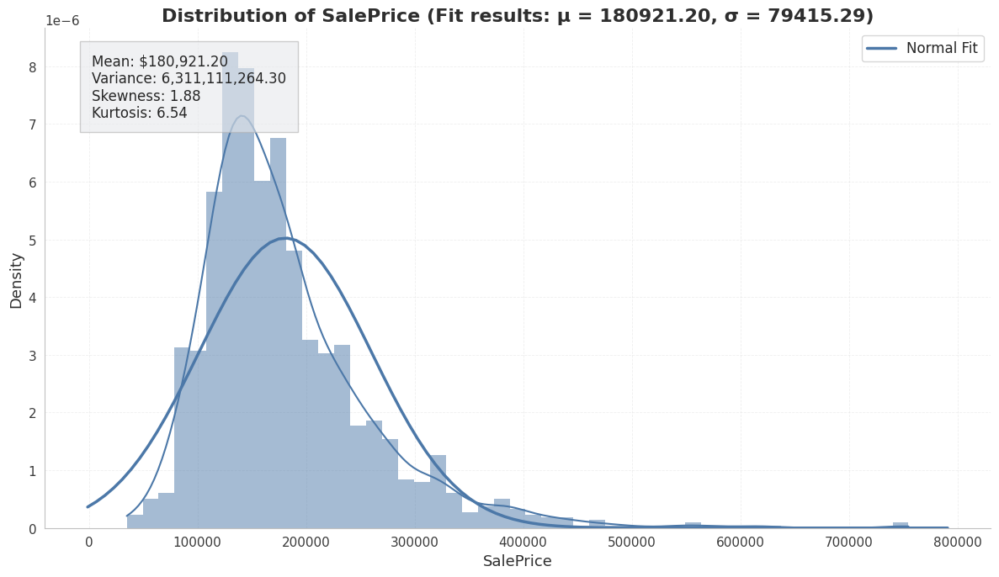

Analysis of SalePrice:
- The distribution is positively skewed (right-skewed).
- A log transformation (np.log1p) can reduce skewness and improve model performance.


In [15]:
# =============================================================================
# 3. TARGET VARIABLE ANALYSIS (SalePrice)
# =============================================================================
print("Step 3: Analyzing the target variable 'SalePrice'...")

# --- AESTHETIC CONFIGURATION (updated color theme) ---
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#C0C0C0",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#2E2E2E",
    "xtick.color": "#3A3A3A",
    "ytick.color": "#3A3A3A",
    "grid.color": "#D7D7D7",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.5,
    "font.size": 11,
    "font.family": "DejaVu Sans",
})

# Palette
c_front = "#4C78A8"   # desaturated blue for main plot
c_other = "#A9A9A9"   # neutral grey for secondary elements
c_line  = "#4C78A8"   # same tone for fitted curve
# ------------------------------------------------------

plt.figure(figsize=(12, 7))
ax = plt.gca()

# Plot histogram with new blue color scheme
sns.histplot(
    df_train["SalePrice"],
    kde=True,
    stat="density",
    linewidth=0,
    color=c_front,
    ax=ax
)

# Fit a normal distribution
mu, sigma = norm.fit(df_train["SalePrice"])
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)

# Plot fitted line with slightly darker blue
plt.plot(x, p, color=c_line, linewidth=2.5, label="Normal Fit")
plt.legend(fontsize=12)

# Title and axis labels
title = f"Distribution of SalePrice (Fit results: μ = {mu:.2f}, σ = {sigma:.2f})"
plt.title(title, fontsize=16, fontweight="bold", color="#2E2E2E")
plt.xlabel("SalePrice", fontsize=13)
plt.ylabel("Density", fontsize=13)

# Add light gridlines
plt.grid(True, linestyle="--", alpha=0.4)

# Clean up spines
sns.despine()

# Compute and display descriptive statistics
mean_price = df_train["SalePrice"].mean()
variance_price = df_train["SalePrice"].var()
skewness_price = df_train["SalePrice"].skew()
kurtosis_price = df_train["SalePrice"].kurt()

stats_text = (
    f"Mean: ${mean_price:,.2f}\n"
    f"Variance: {variance_price:,.2f}\n"
    f"Skewness: {skewness_price:.2f}\n"
    f"Kurtosis: {kurtosis_price:.2f}"
)

# Add a clean, soft grey annotation box
plt.text(
    0.05,
    0.95,
    stats_text,
    transform=ax.transAxes,
    fontsize=12,
    verticalalignment="top",
    bbox={"facecolor": "#E6E8EB", "edgecolor": "#B0B0B0", "alpha": 0.6, "pad": 10}
)

# Final layout adjustment
plt.tight_layout()
plt.show()

# Reset font and style if you plan to make other plots later
plt.rcParams.update(plt.rcParamsDefault)

print("Analysis of SalePrice:")
print("- The distribution is positively skewed (right-skewed).")
print("- A log transformation (np.log1p) can reduce skewness and improve model performance.")

Step 4: Randomly visualizing 3 numerical features with a consistent style...
Selected features for visualization: ['GarageArea', 'TotalBsmtSF', 'BsmtUnfSF']


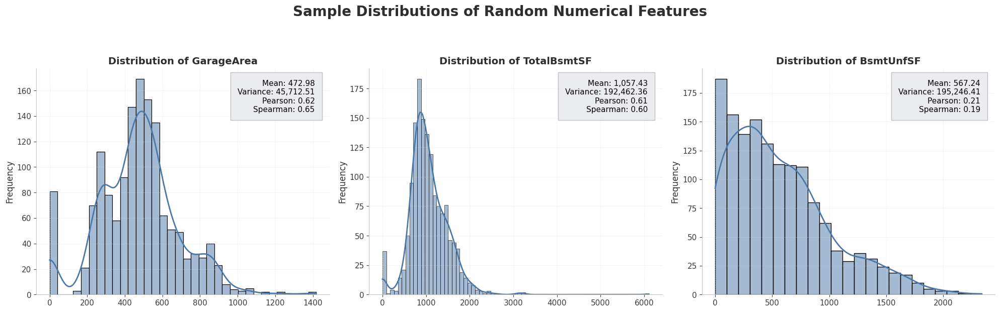

In [16]:
# =============================================================================
# 4. NUMERICAL FEATURES ANALYSIS (Random 3 feature visualization) - UPDATED STYLE
# =============================================================================
print("Step 4: Randomly visualizing 3 numerical features with a consistent style...")

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
import math


numerical_features = ['GarageArea', 'TotalBsmtSF', 'BsmtUnfSF']


# --- AESTHETIC CONFIGURATION (Copied from the target style) ---
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#C0C0C0",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#2E2E2E",
    "xtick.color": "#3A3A3A",
    "ytick.color": "#3A3A3A",
    "grid.color": "#D7D7D7",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.5,
    "font.size": 11,
    "font.family": "DejaVu Sans", # A widely available and clean font
})

# Define the target color palette
c_front = "#4C78A8"   # Desaturated blue for main plot
c_line  = "#4C78A8"   # Same tone for fitted curve
# ----------------------------------------------------------------

# Randomly select 3 features from the list (using the provided ones for consistency)
selected_features= ['GarageArea', 'TotalBsmtSF', 'BsmtUnfSF']
print(f"Selected features for visualization: {selected_features}")

# --- Create a horizontal subplot layout ---
cols = 3
fig, axes = plt.subplots(1, cols, figsize=(20, 6))
axes = axes.flatten()

for i, feature in enumerate(selected_features):
    ax = axes[i]

    # Plot histogram using the new color scheme
    sns.histplot(
        df_train[feature],
        kde=True,
        color=c_front, # Use the new primary color
        ax=ax,
        line_kws={"linewidth": 2, "color": c_line} # Explicitly set KDE line color
    )

    # Title with updated color
    ax.set_title(f"Distribution of {feature}", fontsize=14, fontweight="bold", color="#2E2E2E")

    # Add light gridlines for better readability
    ax.grid(True, linestyle="--", alpha=0.4)

    # Compute statistics
    mean_val = df_train[feature].mean()
    var_val = df_train[feature].var()
    p_corr = df_train[feature].corr(df_train["SalePrice"], method="pearson")
    s_corr = df_train[feature].corr(df_train["SalePrice"], method="spearman")

    # Statistics text box with the new style
    stats_text = (
        f"Mean: {mean_val:,.2f}\n"
        f"Variance: {var_val:,.2f}\n"
        f"Pearson: {p_corr:.2f}\n"
        f"Spearman: {s_corr:.2f}"
    )

    ax.text(
        0.95, 0.95, stats_text,
        transform=ax.transAxes,
        fontsize=11,
        verticalalignment="top",
        horizontalalignment="right",
        # Use the bbox style from the target script
        bbox={"facecolor": "#E6E8EB", "edgecolor": "#B0B0B0", "alpha": 0.8, "pad": 10}
    )

    ax.set_xlabel("")  # Simplify layout
    ax.set_ylabel("Frequency", fontsize=12)
    sns.despine(ax=ax) # Keep despine to remove top/right spines

# --- Adjust layout and show ---
fig.suptitle(
    "Sample Distributions of Random Numerical Features",
    fontsize=20,
    fontweight="bold",
    y=1.03, # Adjust vertical position for the wider title
    color="#2E2E2E" # Set title color
)
plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust rect to prevent suptitle overlap
plt.show()

# Reset matplotlib defaults if you plan to make other plots later
plt.rcParams.update(plt.rcParamsDefault)

In [ ]:
selected_features= ['GarageArea', 'TotalBsmtSF', 'BsmtUnfSF']

['GarageArea', 'TotalBsmtSF', 'BsmtUnfSF']

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

Step 4: Analyzing numerical features (Histograms and Correlations)...
Top 10 features with highest Pearson correlation to SalePrice:
TotalBsmtSF     0.048822
YearBuilt       0.033940
GarageCars      0.026306
TotRmsAbvGrd    0.025803
LotFrontage     0.017288
MSSubClass      0.010061
FullBath        0.008915
MasVnrArea      0.004536
GrLivArea      -0.011905
GarageArea     -0.014608
Name: SalePrice, dtype: float64

Top 10 features with highest Spearman correlation to SalePrice:
TotalBsmtSF     0.043063
TotRmsAbvGrd    0.027645
GarageCars      0.024544
LotFrontage     0.021768
YearBuilt       0.009852
MasVnrArea      0.002781
MSSubClass     -0.002839
GarageArea     -0.003328
GrLivArea      -0.006312
FullBath       -0.006811
Name: SalePrice, dtype: float64

Generating a grid of histograms for all numerical features...


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

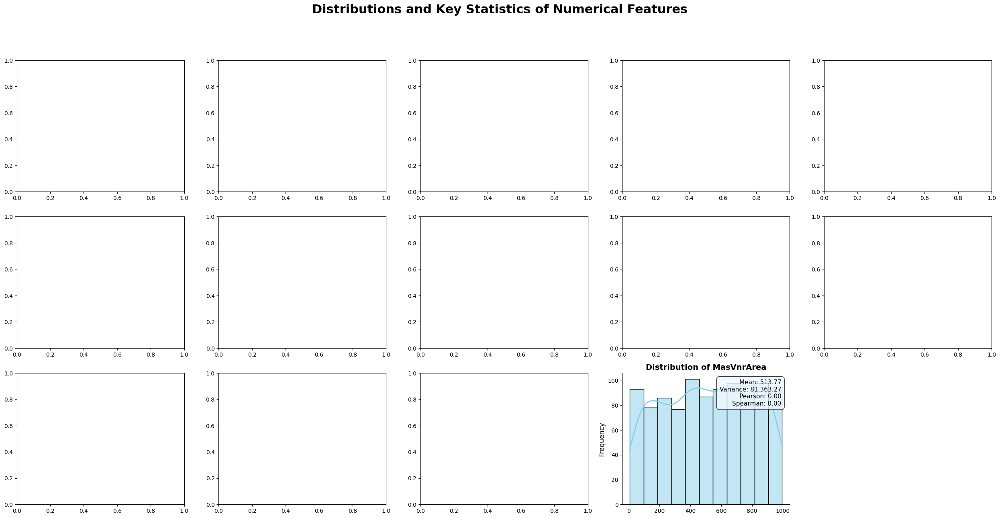

In [9]:

print("Step 4: Analyzing numerical features (Histograms and Correlations)...")

pearson_corr = df_train[numerical_features + ['SalePrice']].corr(method='pearson')['SalePrice'].sort_values(ascending=False)
spearman_corr = df_train[numerical_features + ['SalePrice']].corr(method='spearman')['SalePrice'].sort_values(ascending=False)

print("Top 10 features with highest Pearson correlation to SalePrice:")
print(pearson_corr[1:11]) # Exclude SalePrice itself
print("\nTop 10 features with highest Spearman correlation to SalePrice:")
print(spearman_corr[1:11])



plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Georgia'


print("\nGenerating a grid of histograms for all numerical features...")

import math
num_plots = len(numerical_features)
cols = 5 # Use 5 columns so there are 5 plots per row
rows = math.ceil(num_plots / cols)

fig, axes = plt.subplots(rows, cols, figsize=(25, rows * 4.2))


axes = axes.flatten() if hasattr(axes, 'flatten') else np.array([axes])

for i, feature in enumerate(numerical_features):
    ax = axes[i] # Get the current axis



# Plot the histogram
sns.histplot(df_train[feature], kde=True, color='skyblue', ax=ax, line_kws={'linewidth': 2})

# --- Add titles and stats ---
# Set a bold title for each subplot
ax.set_title(f'Distribution of {feature}', fontsize=14, fontweight='bold')

# Calculate stats
mean_val = df_train[feature].mean()
var_val = df_train[feature].var()
p_corr = df_train[feature].corr(df_train['SalePrice'], method='pearson')
s_corr = df_train[feature].corr(df_train['SalePrice'], method='spearman')

# Format stats text to be placed inside the plot
stats_text = (f"Mean: {mean_val:,.2f}\n"
              f"Variance: {var_val:,.2f}\n"
              f"Pearson: {p_corr:.2f}\n"
              f"Spearman: {s_corr:.2f}")

# Add stats text box to the top right corner of the subplot
ax.text(0.95, 0.95, stats_text, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round,pad=0.5', fc='aliceblue', alpha=0.8))
        
# Set labels and clean up the look
ax.set_xlabel("") # Remove individual x-labels to reduce clutter
ax.set_ylabel("Frequency", fontsize=12)
sns.despine(ax=ax)

for i in range(num_plots, len(axes)):
    axes[i].set_visible(False)


fig.suptitle('Distributions and Key Statistics of Numerical Features', fontsize=22, fontweight='bold', y=1.02)


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


plt.rcParams.update(plt.rcParamsDefault)

Step 4: Analyzing numerical features (Histograms and Correlations)...
Top 10 features with highest Pearson correlation to SalePrice:
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
GarageYrBlt     0.486362
Name: SalePrice, dtype: float64

Top 10 features with highest Spearman correlation to SalePrice:
GrLivArea       0.731310
GarageCars      0.690711
YearBuilt       0.652682
GarageArea      0.649379
FullBath        0.635957
TotalBsmtSF     0.602725
GarageYrBlt     0.593788
1stFlrSF        0.575408
YearRemodAdd    0.571159
TotRmsAbvGrd    0.532586
Name: SalePrice, dtype: float64

Generating histograms for numerical features...


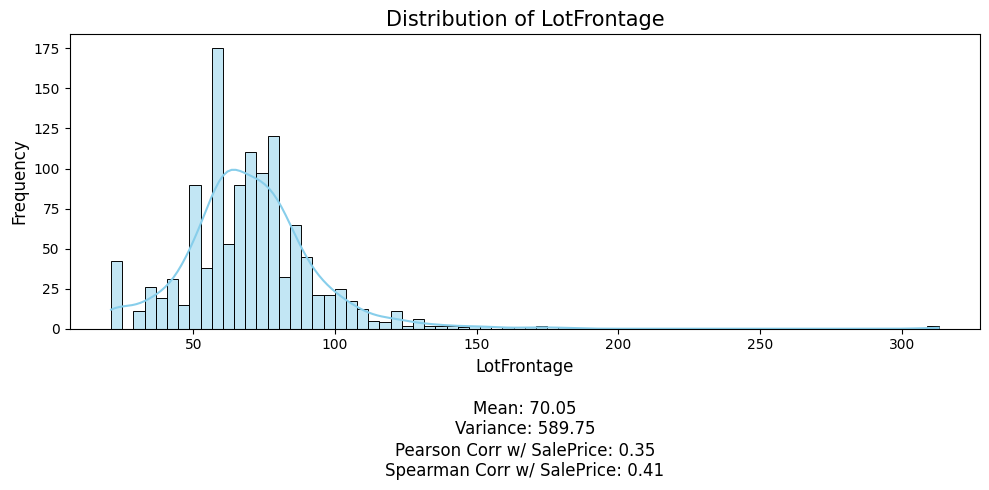

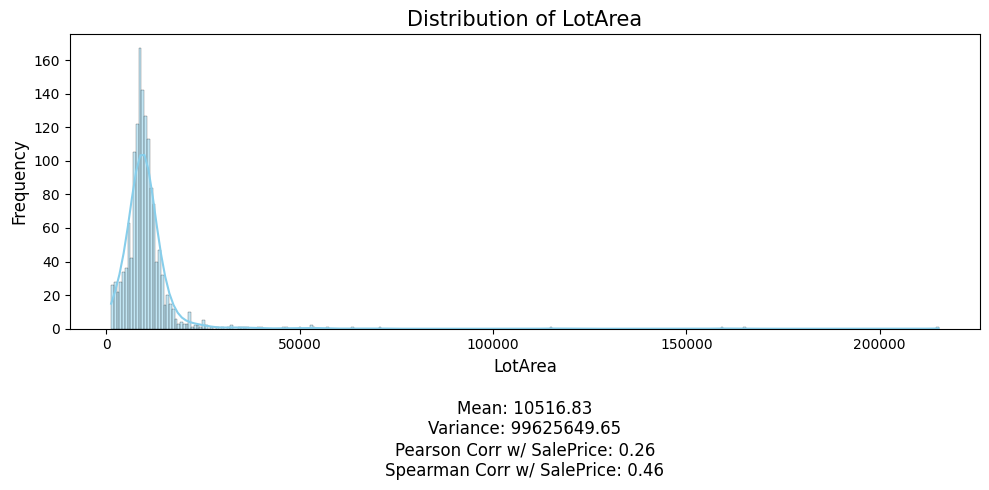

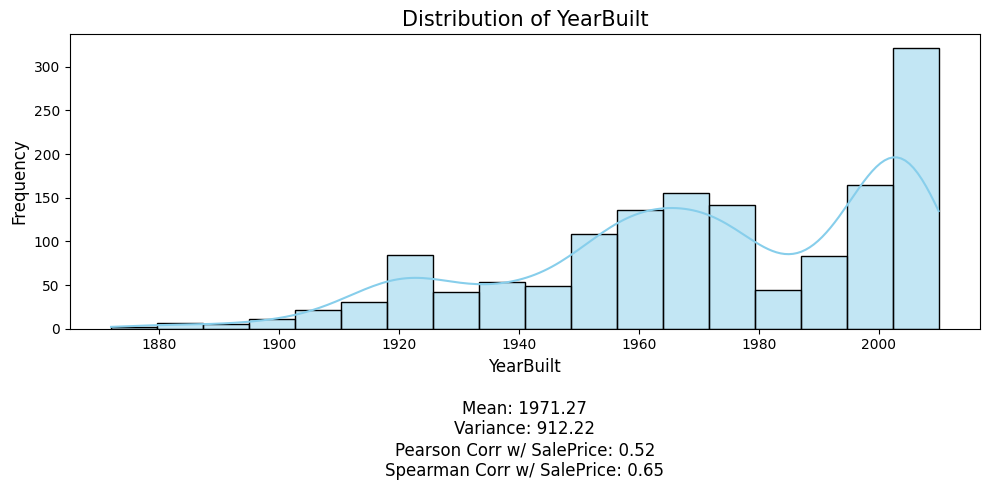

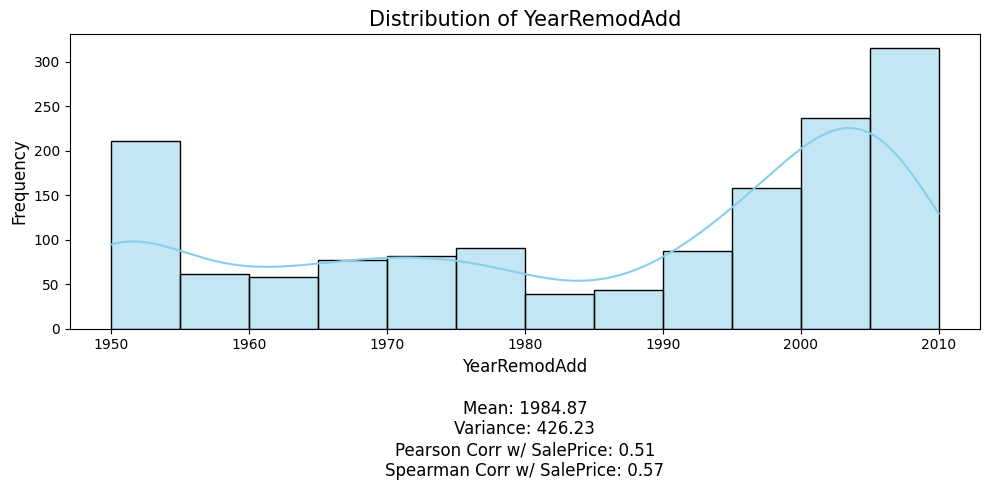

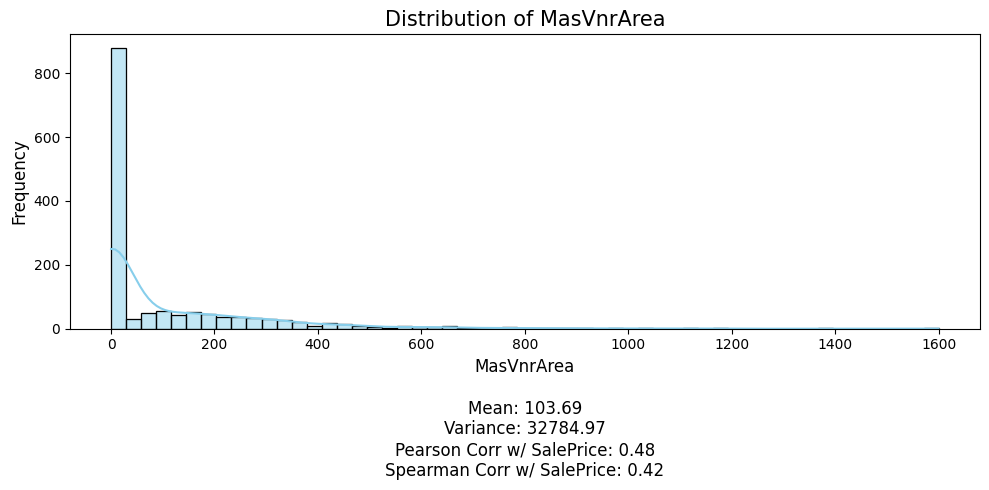

...

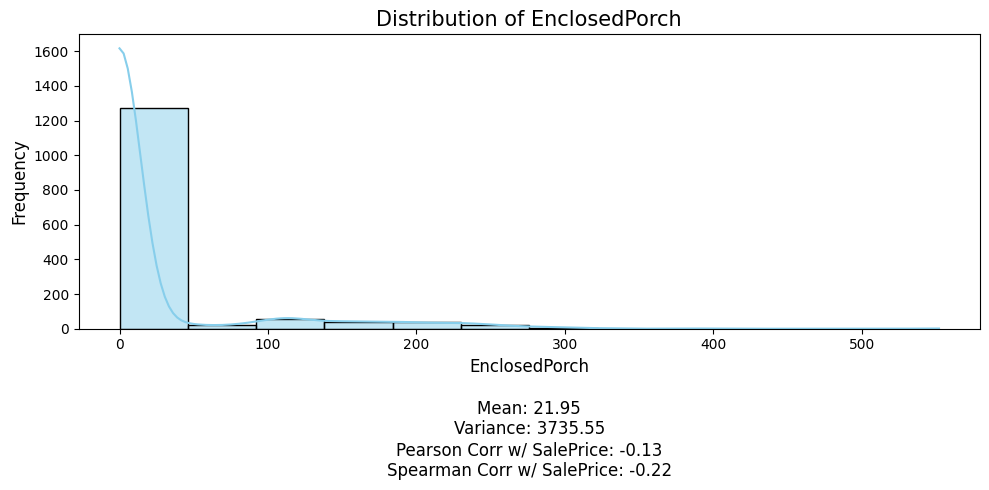

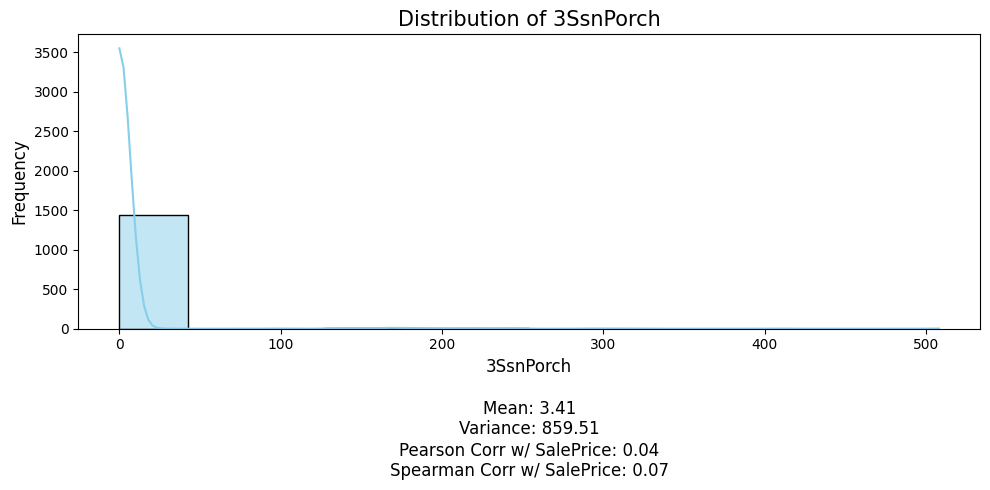

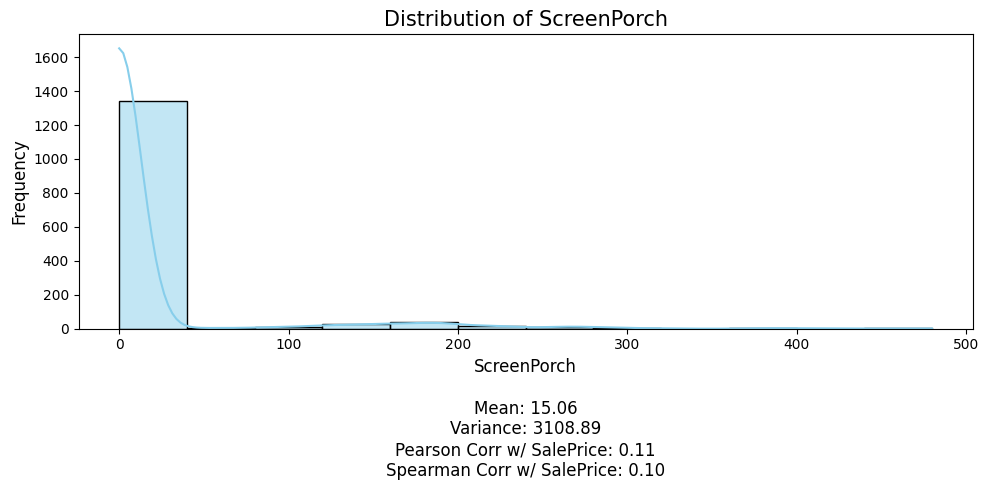

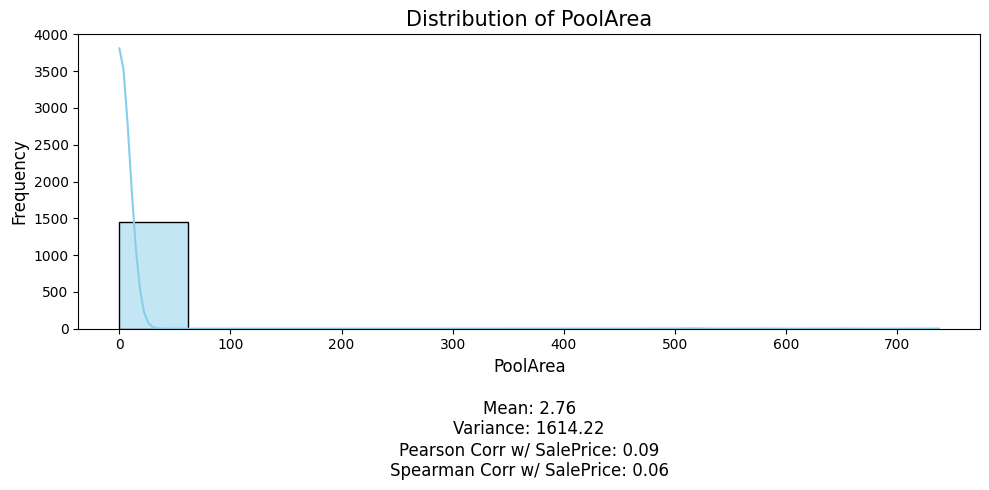

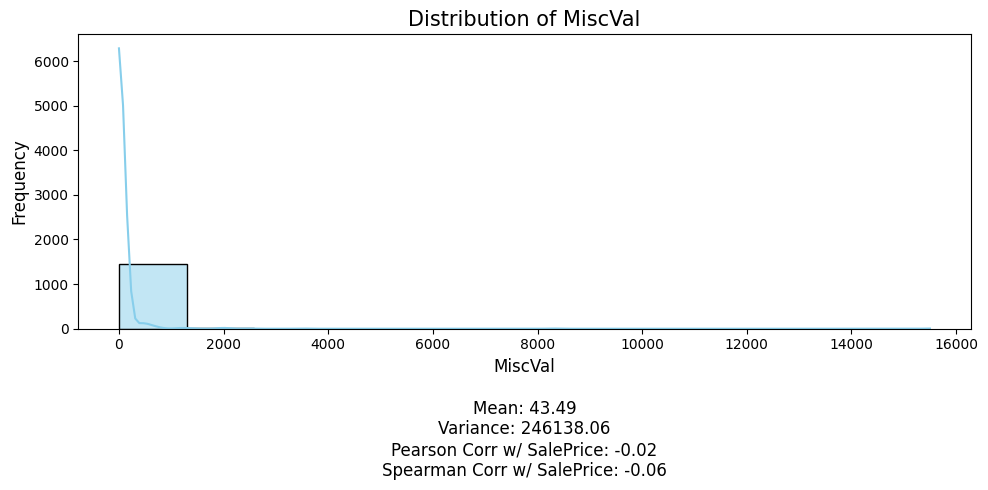

In [7]:
# 4. NUMERICAL FEATURES ANALYSIS
# =============================================================================
print("Step 4: Analyzing numerical features (Histograms and Correlations)...")

# Calculate correlations first
pearson_corr = df_train[numerical_features + ['SalePrice']].corr(method='pearson')['SalePrice'].sort_values(ascending=False)
spearman_corr = df_train[numerical_features + ['SalePrice']].corr(method='spearman')['SalePrice'].sort_values(ascending=False)

print("Top 10 features with highest Pearson correlation to SalePrice:")
print(pearson_corr[1:11]) # Exclude SalePrice itself
print("\nTop 10 features with highest Spearman correlation to SalePrice:")
print(spearman_corr[1:11])

# Plot histograms for all numerical features
print("\nGenerating histograms for numerical features...")
for feature in numerical_features:
    plt.figure(figsize=(10, 5))
    sns.histplot(df_train[feature], kde=True, color='skyblue')
    
    # Get correlation values
    p_corr = df_train[feature].corr(df_train['SalePrice'], method='pearson')
    s_corr = df_train[feature].corr(df_train['SalePrice'], method='spearman')
    
    # Add title and stats
    plt.title(f'Distribution of {feature}', fontsize=15)
    mean_val = df_train[feature].mean()
    var_val = df_train[feature].var()
    stats_text = (f"Mean: {mean_val:.2f}\n"
                  f"Variance: {var_val:.2f}\n"
                  f"Pearson Corr w/ SalePrice: {p_corr:.2f}\n"
                  f"Spearman Corr w/ SalePrice: {s_corr:.2f}")
    
    plt.xlabel(f"{feature}\n\n{stats_text}", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.tight_layout()
    plt.show()


Step 4: Visualizing random numerical features with consistent styling...
Selected features for visualization: ['Fireplaces', 'YearRemodAdd', 'BsmtFullBath']


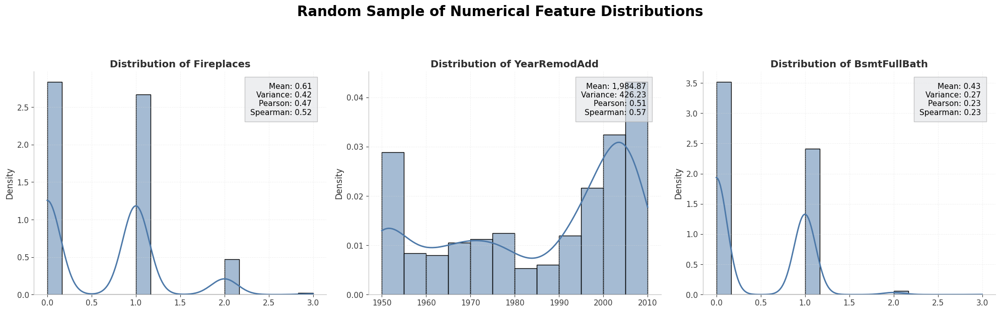

In [12]:
# =============================================================================
# 4. NUMERICAL FEATURES ANALYSIS (Random 3 features, consistent color theme)
# =============================================================================
print("Step 4: Visualizing random numerical features with consistent styling...")

import random

# --- STYLE SETTINGS (same as before) ---
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#C0C0C0",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#2E2E2E",
    "xtick.color": "#3A3A3A",
    "ytick.color": "#3A3A3A",
    "grid.color": "#D7D7D7",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.5,
    "font.size": 11,
    "font.family": "DejaVu Sans",
})

# Palette
c_front = "#4C78A8"   # main blue
c_other = "#A9A9A9"   # neutral grey
# --------------------------------------

# Randomly pick 3 numerical features

selected_features = random.sample(numerical_features, 3)
selected_features =["Fireplaces", "YearRemodAdd","BsmtFullBath"]
print(f"Selected features for visualization: {selected_features}")

# Create subplots horizontally
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes = axes.flatten()

for i, feature in enumerate(selected_features):
    ax = axes[i]

    # Plot histogram with KDE
    sns.histplot(
        df_train[feature],
        kde=True,
        stat="density",
        color=c_front,
        ax=ax,
        line_kws={"linewidth": 2}
    )

    # Title
    ax.set_title(f"Distribution of {feature}", fontsize=14, fontweight="bold", color="#2E2E2E")

    # Compute stats and correlations
    mean_val = df_train[feature].mean()
    var_val = df_train[feature].var()
    p_corr = df_train[feature].corr(df_train["SalePrice"], method="pearson")
    s_corr = df_train[feature].corr(df_train["SalePrice"], method="spearman")

    # Add stats box
    stats_text = (
        f"Mean: {mean_val:,.2f}\n"
        f"Variance: {var_val:,.2f}\n"
        f"Pearson: {p_corr:.2f}\n"
        f"Spearman: {s_corr:.2f}"
    )
    ax.text(
        0.95, 0.95, stats_text,
        transform=ax.transAxes,
        fontsize=11,
        verticalalignment="top",
        horizontalalignment="right",
        bbox={"facecolor": "#E6E8EB", "edgecolor": "#B0B0B0", "alpha": 0.7, "pad": 8}
    )

    # Labels and styling
    ax.set_xlabel("")
    ax.set_ylabel("Density", fontsize=12)
    ax.grid(True, linestyle="--", alpha=0.4)
    sns.despine(ax=ax)

# Overall title
fig.suptitle("Random Sample of Numerical Feature Distributions", fontsize=20, fontweight="bold", y=1.03)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# reset matplotlib defaults
plt.rcParams.update(plt.rcParamsDefault)

Step 5: Analyzing categorical features (Bar Charts)...

Feature: 'MSZoning'
  - Number of unique categories: 5
  - Categories: ['C (all)', 'FV', 'RH', 'RL', 'RM']


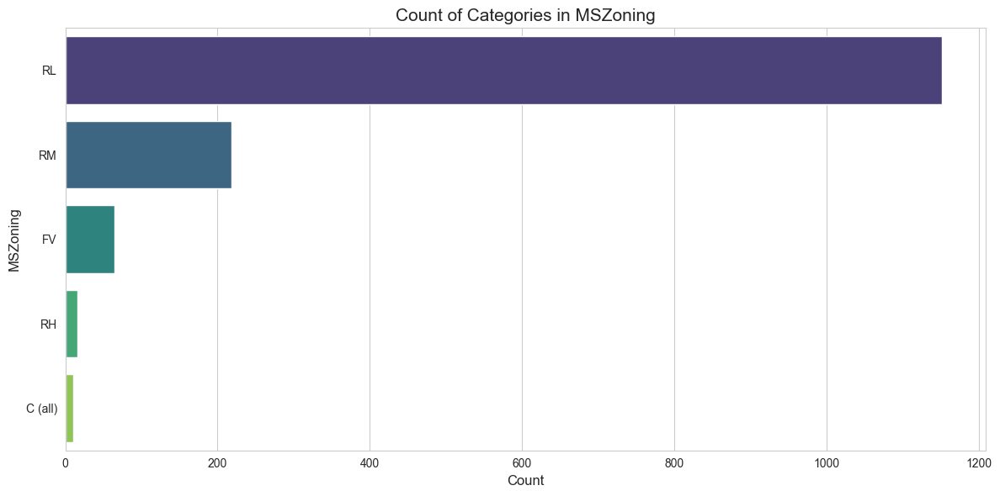


Feature: 'Street'
  - Number of unique categories: 2
  - Categories: ['Grvl', 'Pave']


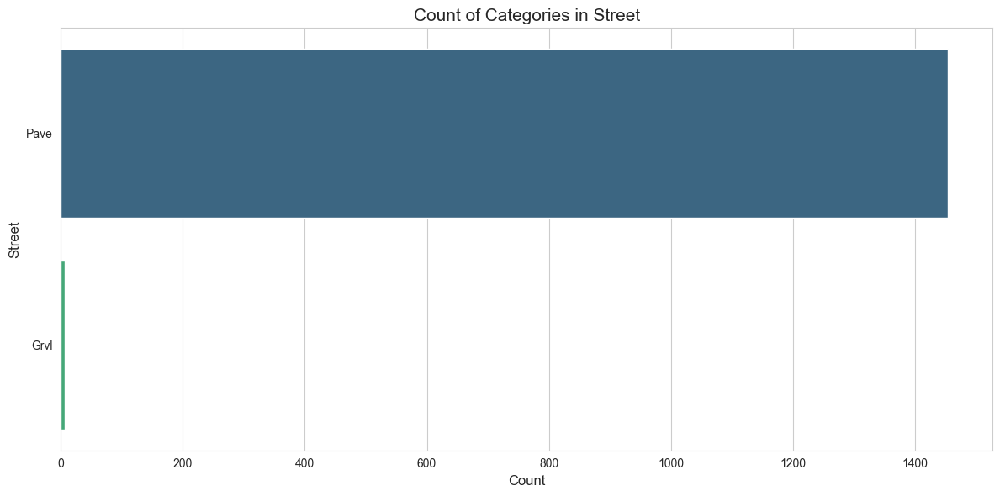


Feature: 'Alley'
  - Number of unique categories: 2
  - Categories: ['Grvl', 'Pave', 'nan']


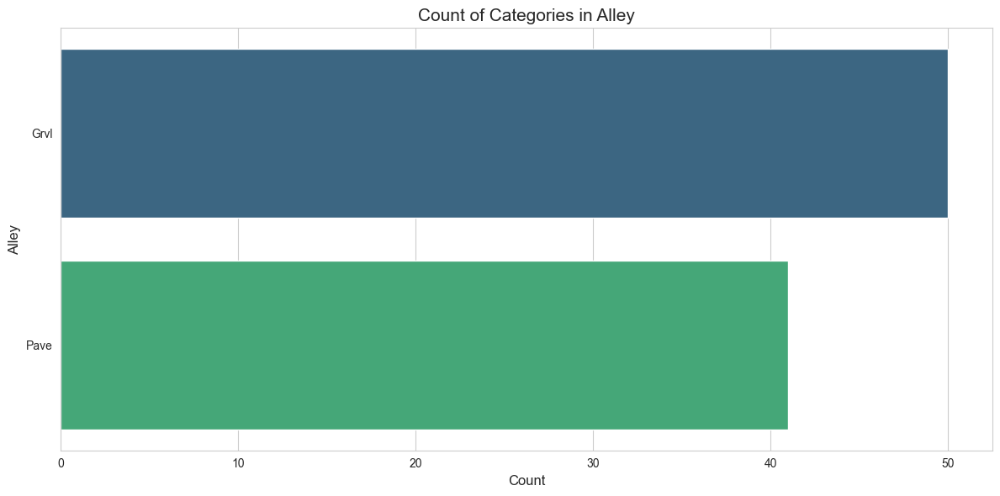


Feature: 'LotShape'
  - Number of unique categories: 4
  - Categories: ['IR1', 'IR2', 'IR3', 'Reg']


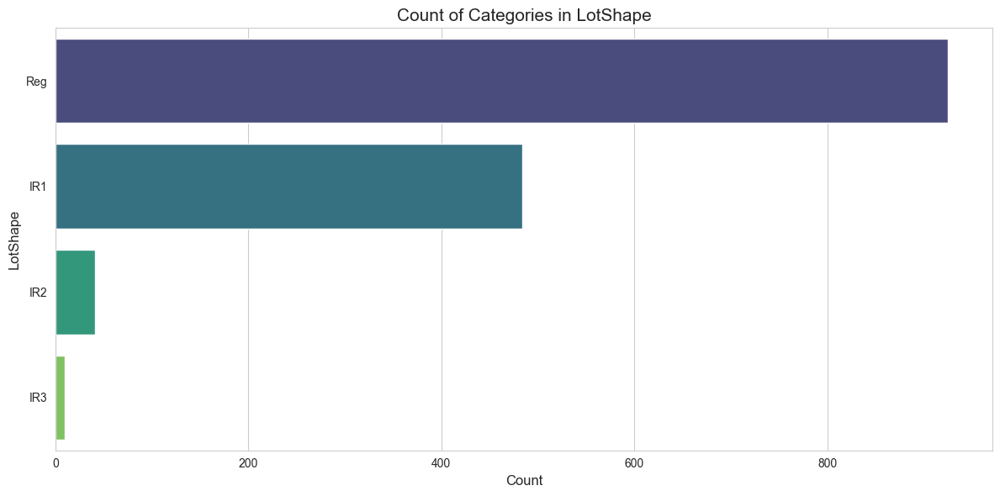


Feature: 'LandContour'
  - Number of unique categories: 4
  - Categories: ['Bnk', 'HLS', 'Low', 'Lvl']


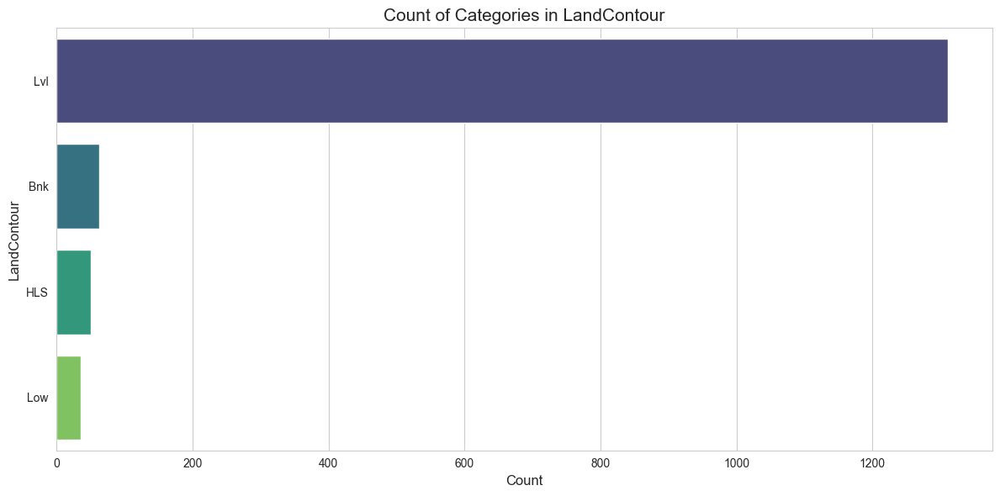


Feature: 'Utilities'
  - Number of unique categories: 2
  - Categories: ['AllPub', 'NoSeWa']


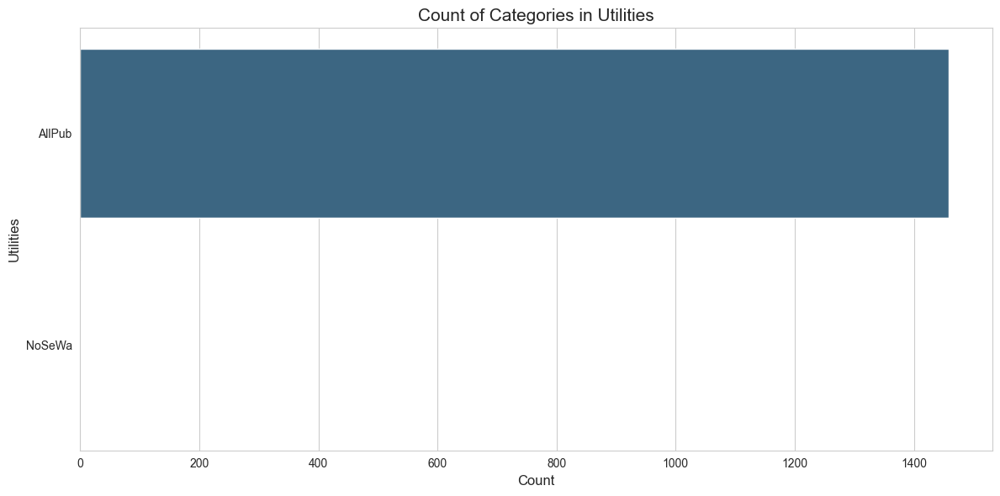


Feature: 'LotConfig'
  - Number of unique categories: 5
  - Categories: ['Corner', 'CulDSac', 'FR2', 'FR3', 'Inside']


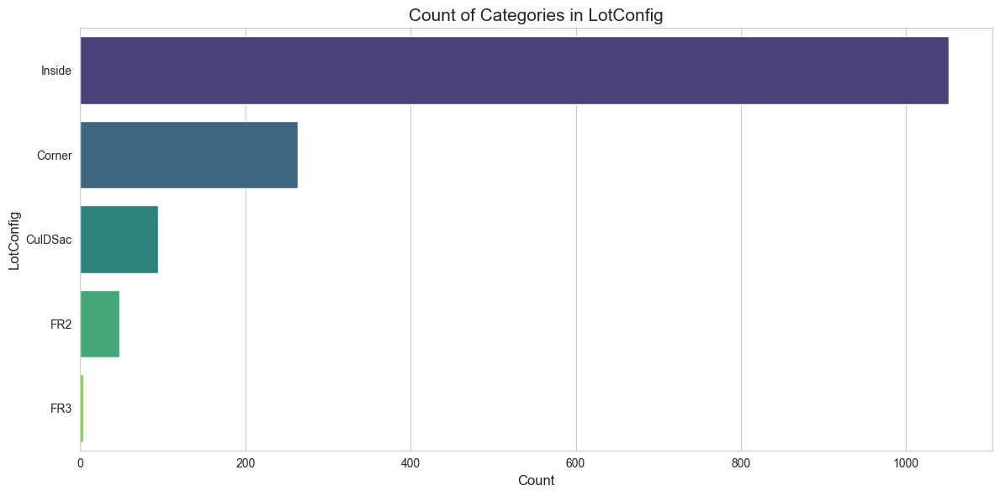


Feature: 'LandSlope'
  - Number of unique categories: 3
  - Categories: ['Gtl', 'Mod', 'Sev']


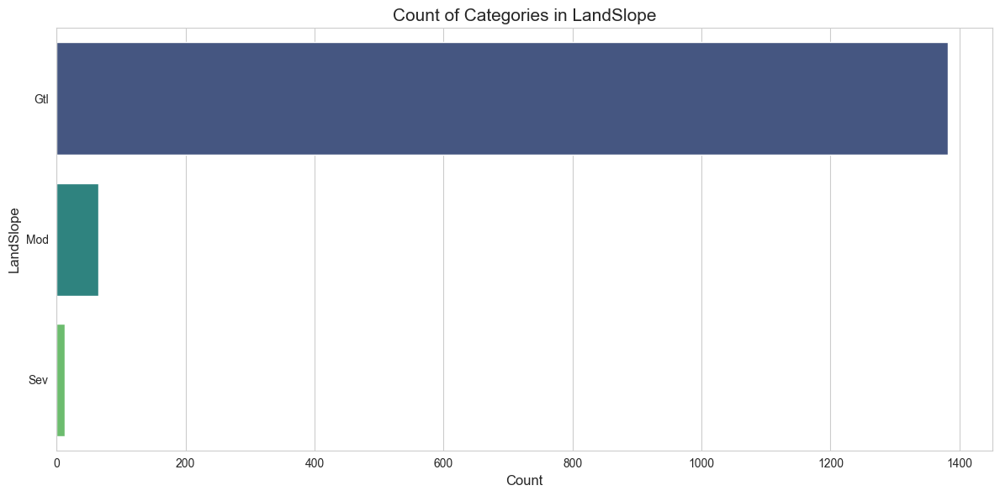


Feature: 'Neighborhood'
  - Number of unique categories: 25
  - Categories are too numerous to list here (e.g., Neighborhood).


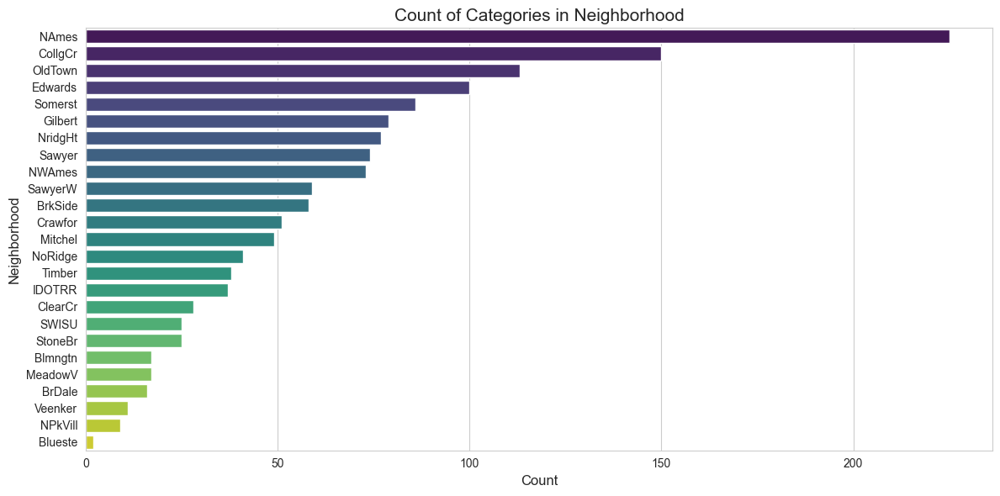


Feature: 'Condition1'
  - Number of unique categories: 9
  - Categories: ['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNe', 'RRNn']


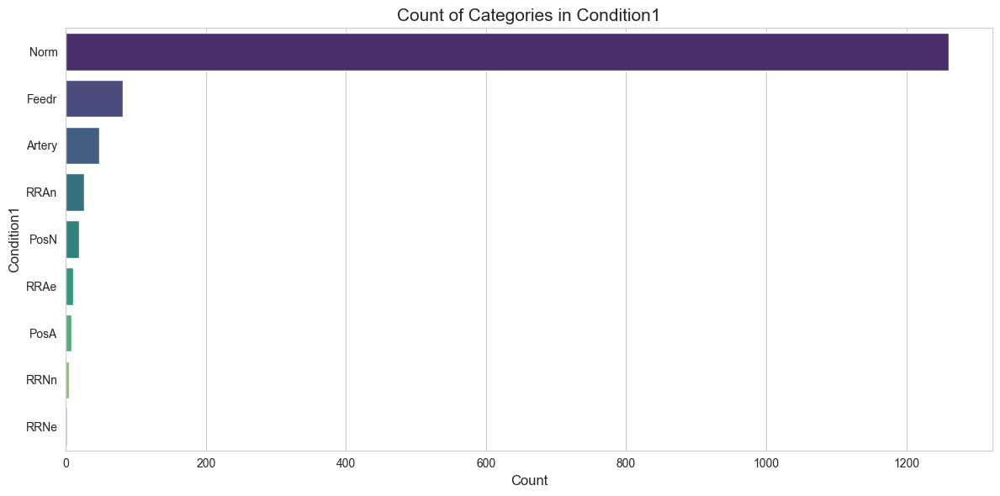


Feature: 'Condition2'
  - Number of unique categories: 8
  - Categories: ['Artery', 'Feedr', 'Norm', 'PosA', 'PosN', 'RRAe', 'RRAn', 'RRNn']


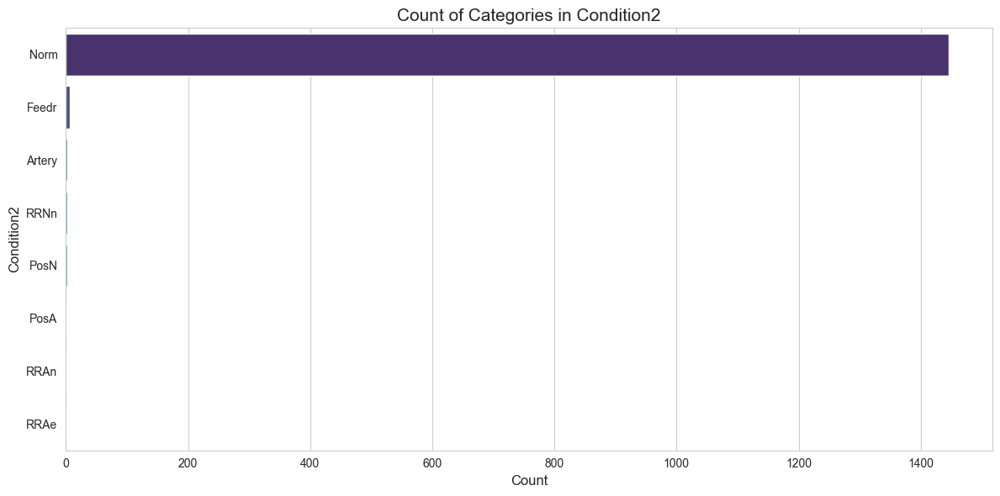


Feature: 'BldgType'
  - Number of unique categories: 5
  - Categories: ['1Fam', '2fmCon', 'Duplex', 'Twnhs', 'TwnhsE']


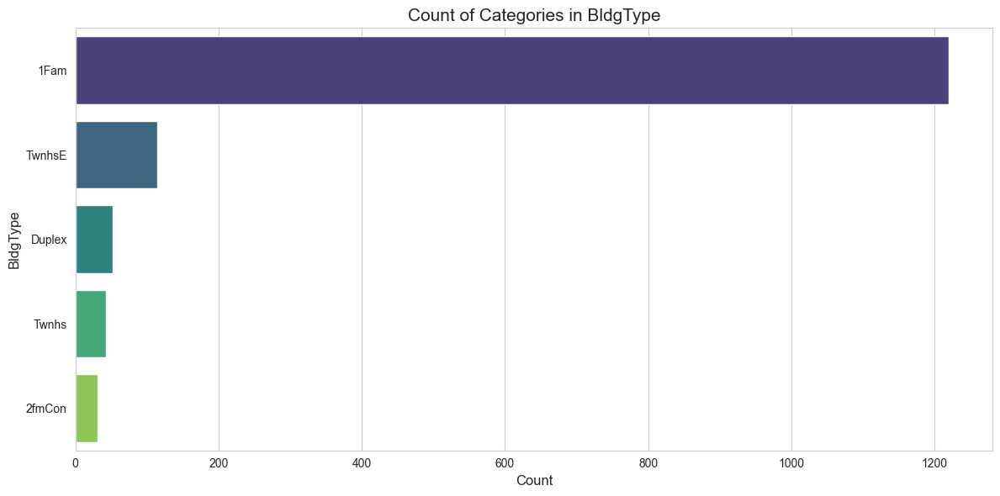


Feature: 'HouseStyle'
  - Number of unique categories: 8
  - Categories: ['1.5Fin', '1.5Unf', '1Story', '2.5Fin', '2.5Unf', '2Story', 'SFoyer', 'SLvl']


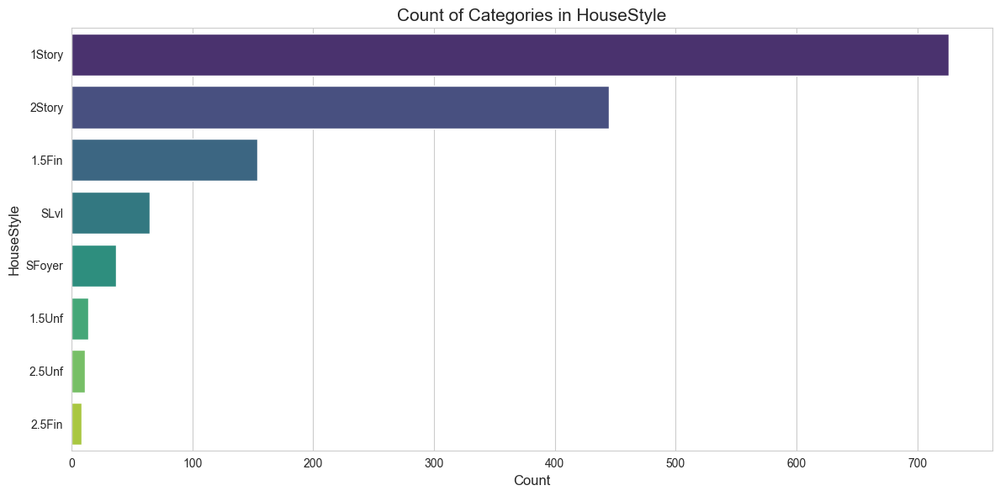


Feature: 'RoofStyle'
  - Number of unique categories: 6
  - Categories: ['Flat', 'Gable', 'Gambrel', 'Hip', 'Mansard', 'Shed']


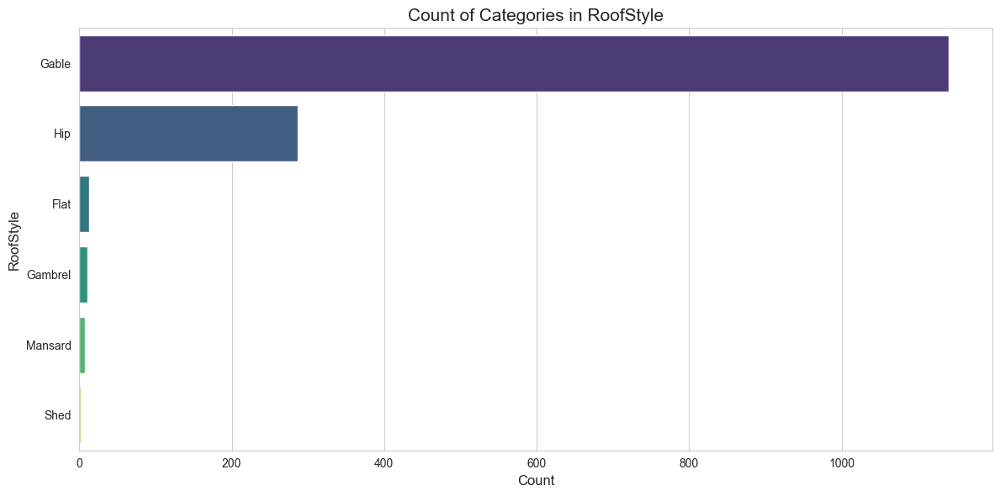


Feature: 'RoofMatl'
  - Number of unique categories: 8
  - Categories: ['ClyTile', 'CompShg', 'Membran', 'Metal', 'Roll', 'Tar&Grv', 'WdShake', 'WdShngl']


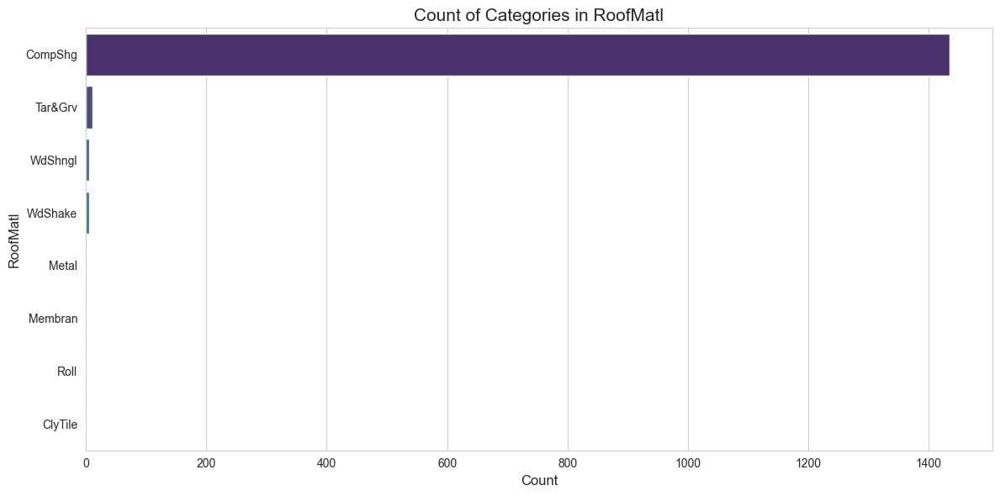


Feature: 'Exterior1st'
  - Number of unique categories: 15
  - Categories are too numerous to list here (e.g., Neighborhood).


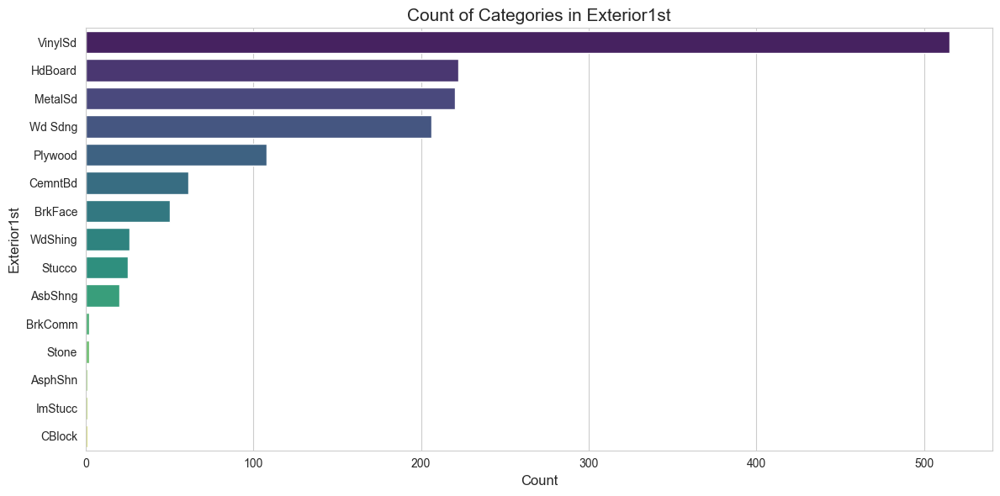


Feature: 'Exterior2nd'
  - Number of unique categories: 16
  - Categories are too numerous to list here (e.g., Neighborhood).


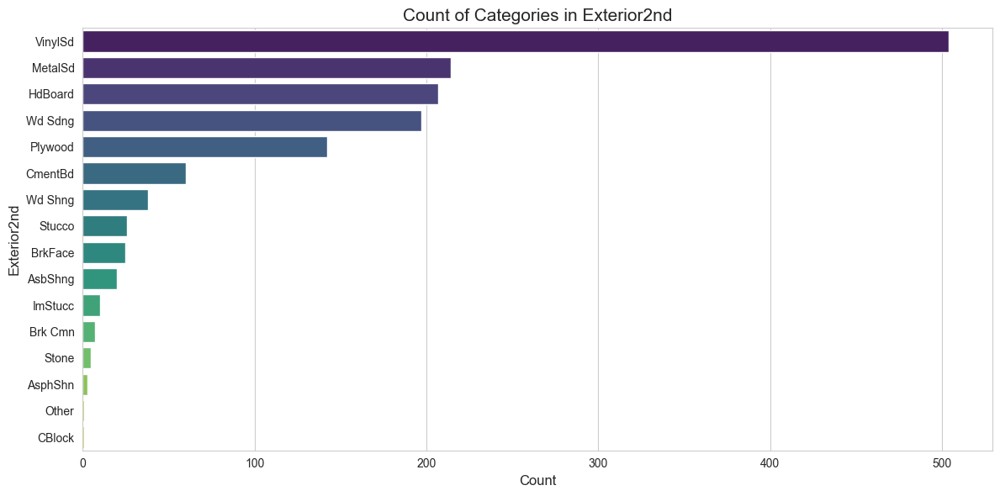


Feature: 'MasVnrType'
  - Number of unique categories: 3
  - Categories: ['BrkCmn', 'BrkFace', 'Stone', 'nan']


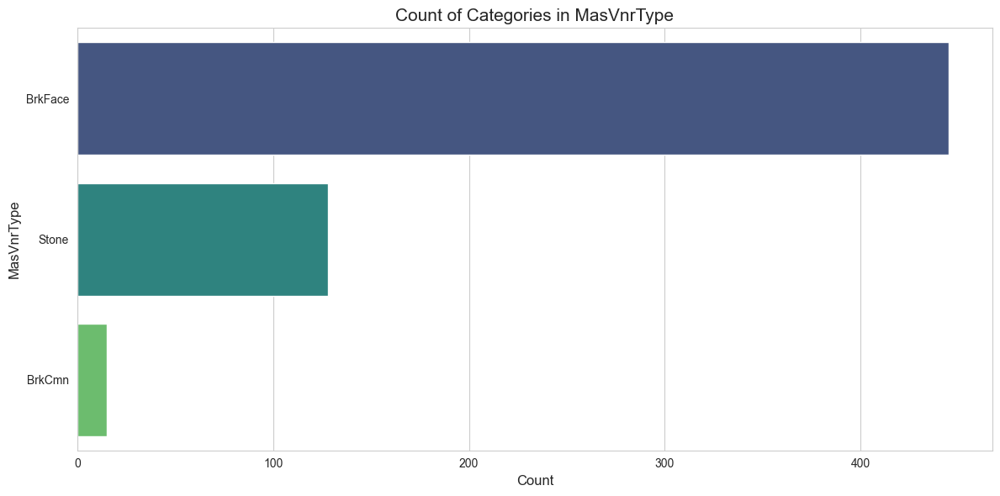


Feature: 'ExterQual'
  - Number of unique categories: 4
  - Categories: ['Ex', 'Fa', 'Gd', 'TA']


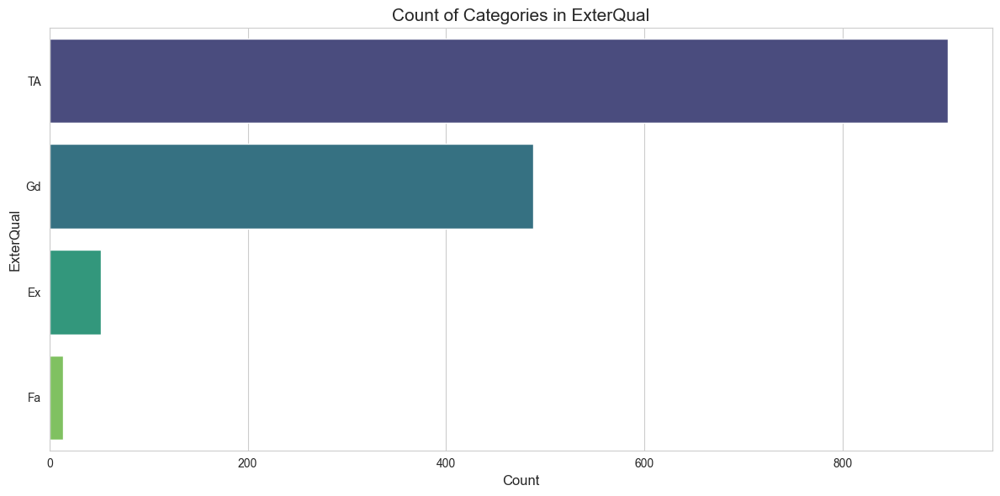


Feature: 'ExterCond'
  - Number of unique categories: 5
  - Categories: ['Ex', 'Fa', 'Gd', 'Po', 'TA']


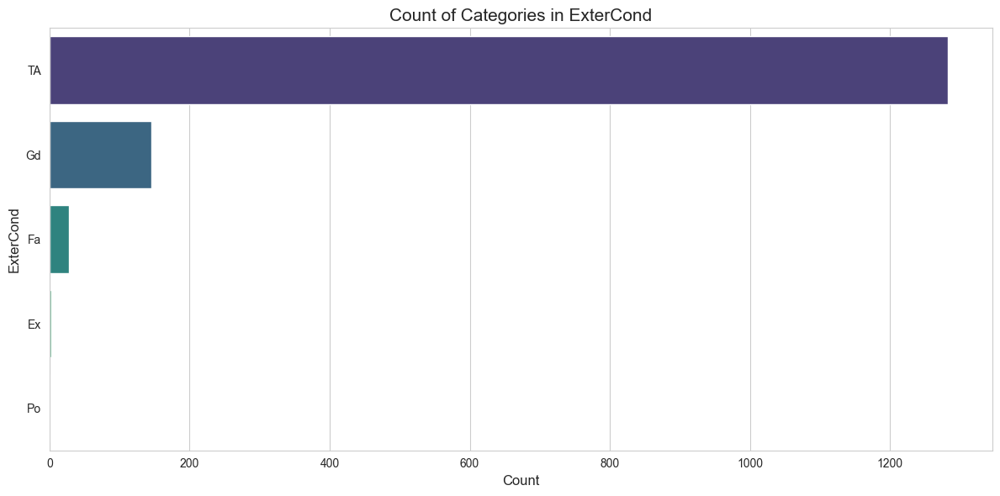


Feature: 'Foundation'
  - Number of unique categories: 6
  - Categories: ['BrkTil', 'CBlock', 'PConc', 'Slab', 'Stone', 'Wood']


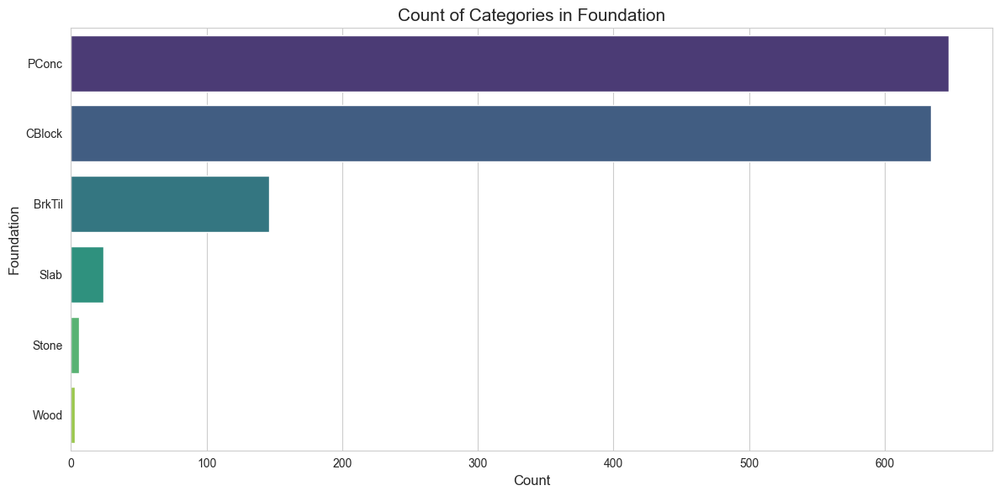


Feature: 'BsmtQual'
  - Number of unique categories: 4
  - Categories: ['Ex', 'Fa', 'Gd', 'TA', 'nan']


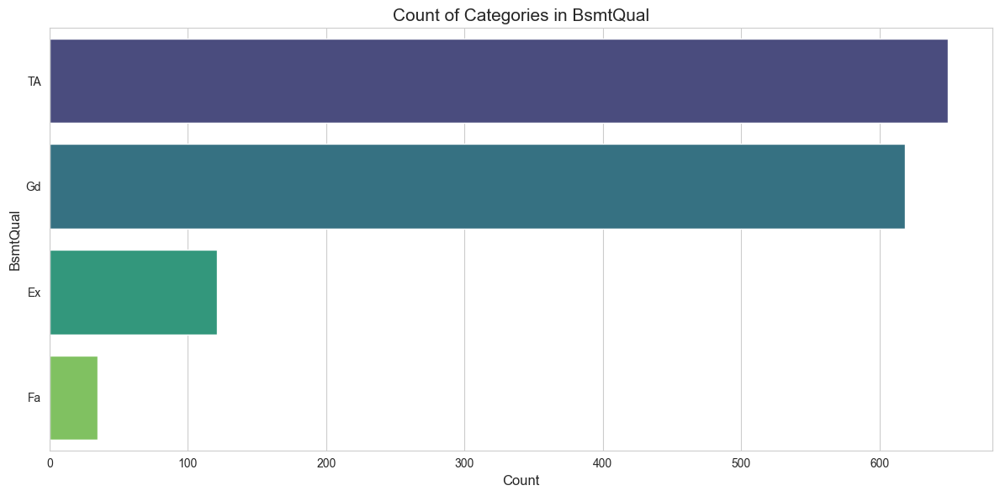


Feature: 'BsmtCond'
  - Number of unique categories: 4
  - Categories: ['Fa', 'Gd', 'Po', 'TA', 'nan']


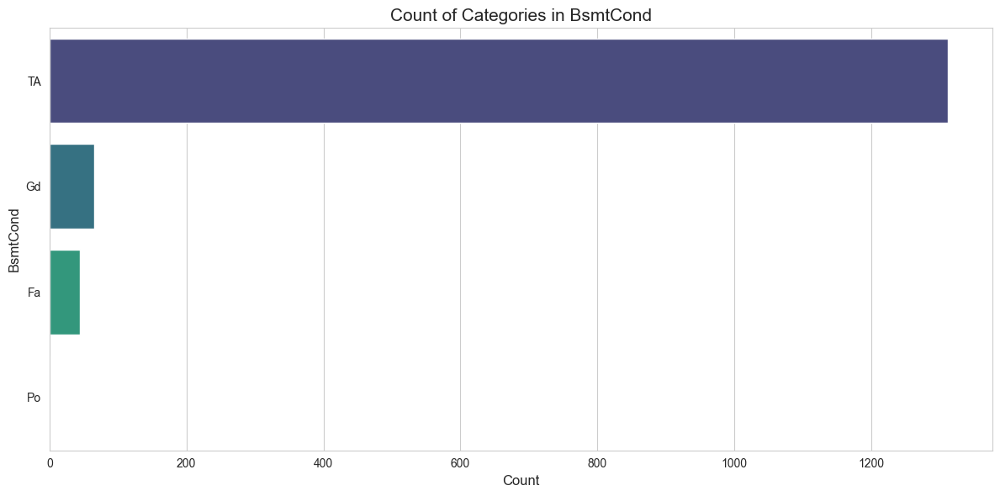


Feature: 'BsmtExposure'
  - Number of unique categories: 4
  - Categories: ['Av', 'Gd', 'Mn', 'No', 'nan']


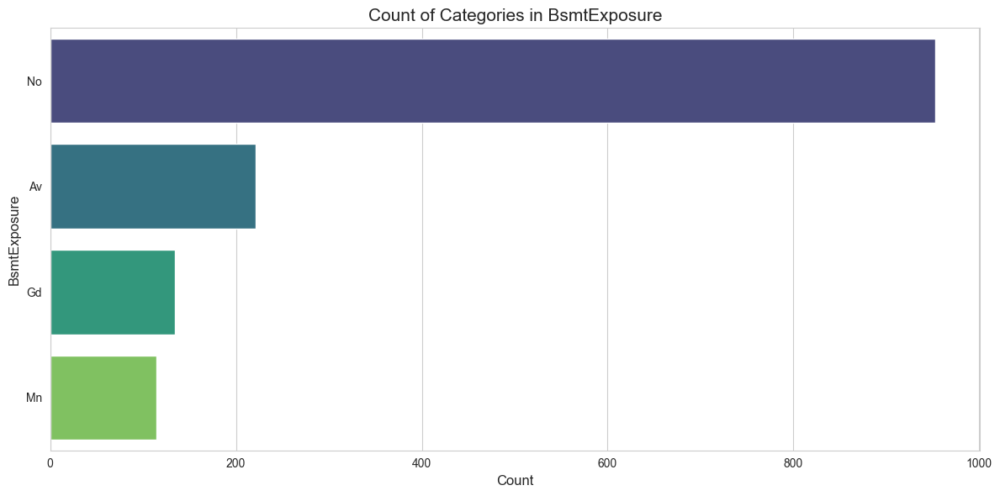


Feature: 'BsmtFinType1'
  - Number of unique categories: 6
  - Categories: ['ALQ', 'BLQ', 'GLQ', 'LwQ', 'Rec', 'Unf', 'nan']


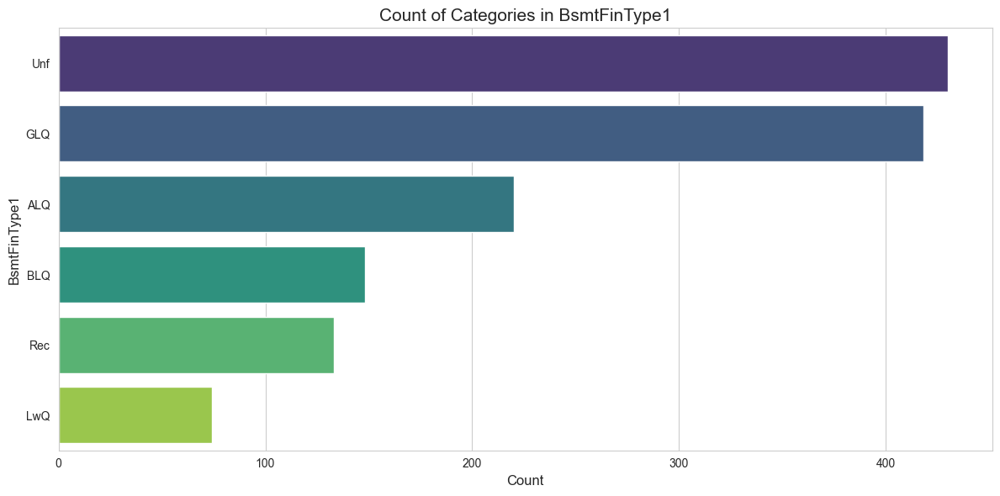


Feature: 'BsmtFinType2'
  - Number of unique categories: 6
  - Categories: ['ALQ', 'BLQ', 'GLQ', 'LwQ', 'Rec', 'Unf', 'nan']


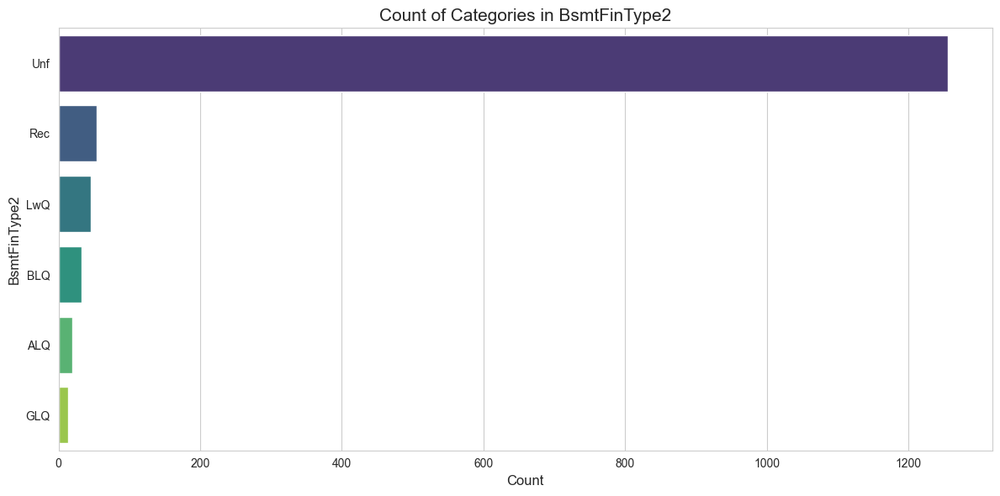


Feature: 'Heating'
  - Number of unique categories: 6
  - Categories: ['Floor', 'GasA', 'GasW', 'Grav', 'OthW', 'Wall']


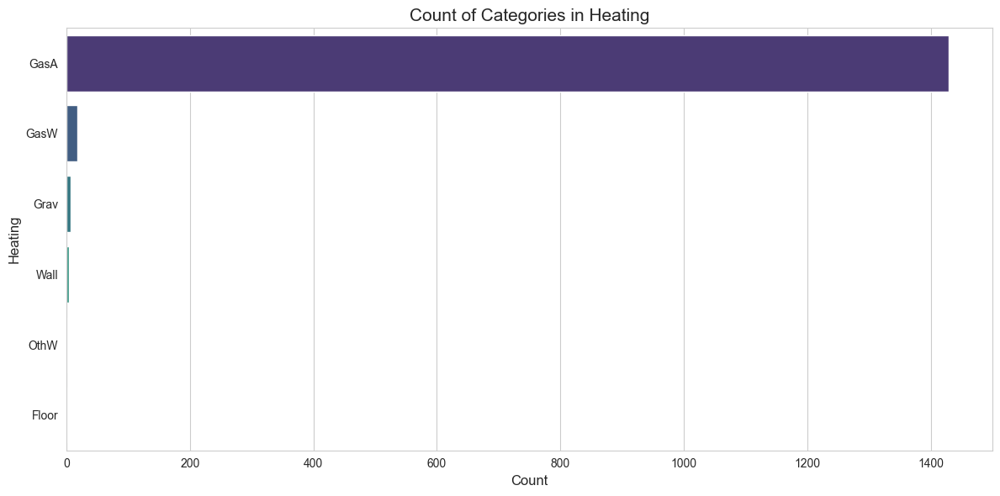


Feature: 'HeatingQC'
  - Number of unique categories: 5
  - Categories: ['Ex', 'Fa', 'Gd', 'Po', 'TA']


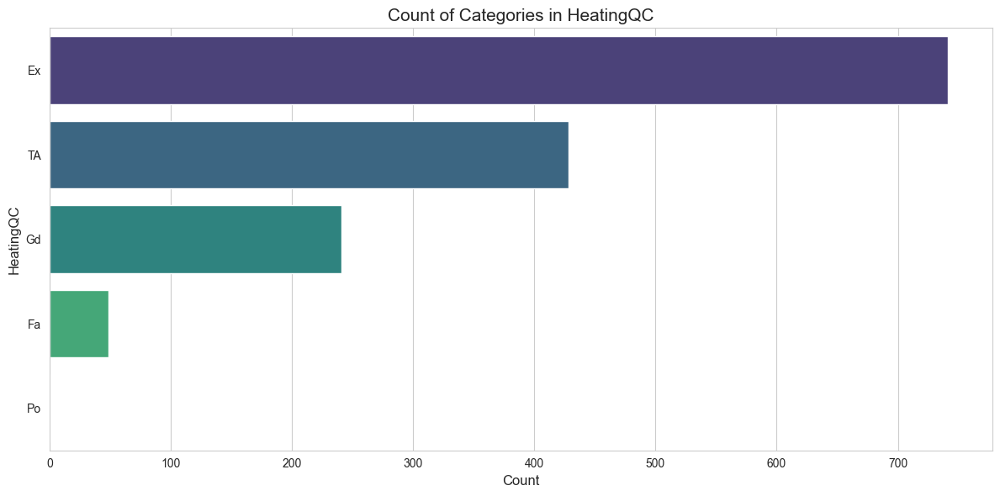


Feature: 'CentralAir'
  - Number of unique categories: 2
  - Categories: ['N', 'Y']


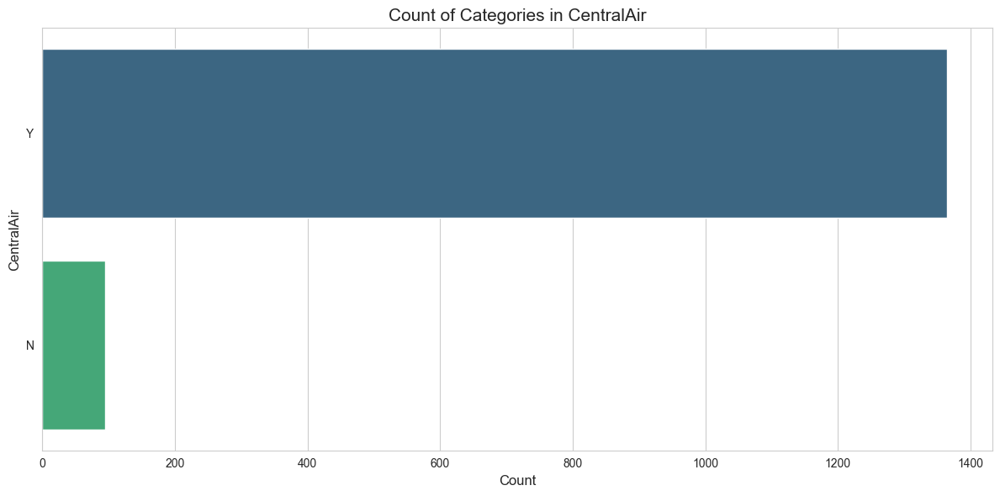


Feature: 'Electrical'
  - Number of unique categories: 5
  - Categories: ['FuseA', 'FuseF', 'FuseP', 'Mix', 'SBrkr', 'nan']


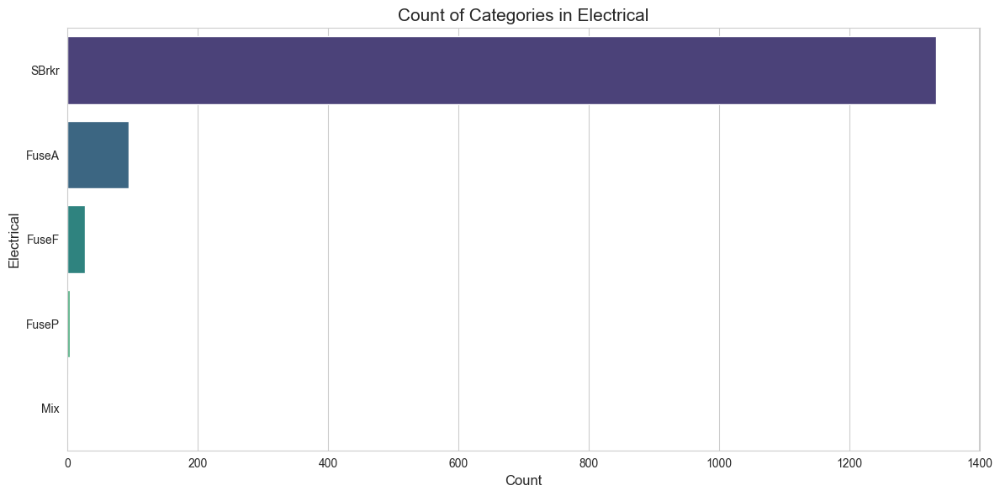


Feature: 'KitchenQual'
  - Number of unique categories: 4
  - Categories: ['Ex', 'Fa', 'Gd', 'TA']


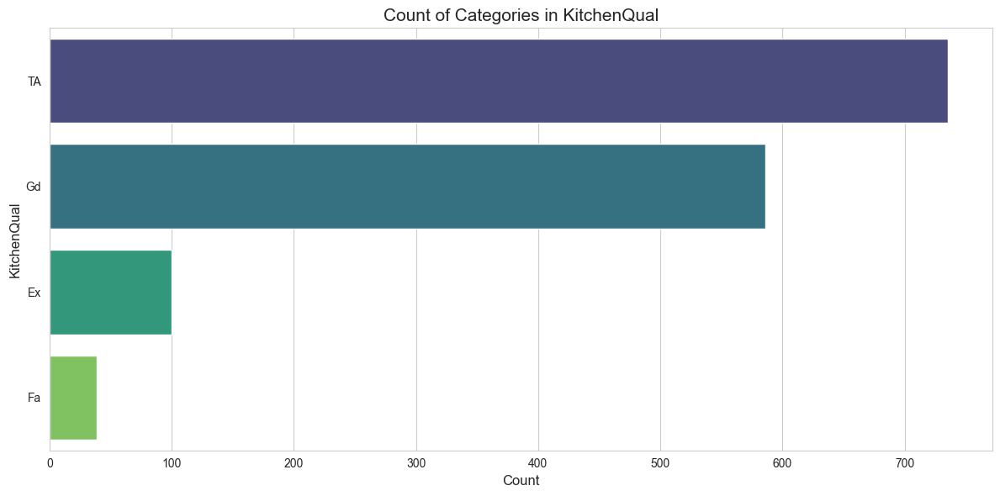


Feature: 'Functional'
  - Number of unique categories: 7
  - Categories: ['Maj1', 'Maj2', 'Min1', 'Min2', 'Mod', 'Sev', 'Typ']


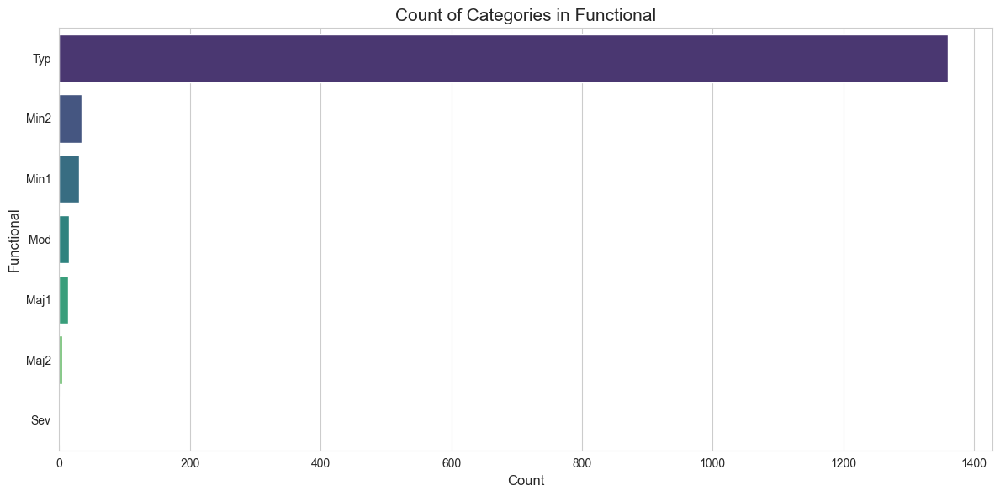


Feature: 'FireplaceQu'
  - Number of unique categories: 5
  - Categories: ['Ex', 'Fa', 'Gd', 'Po', 'TA', 'nan']


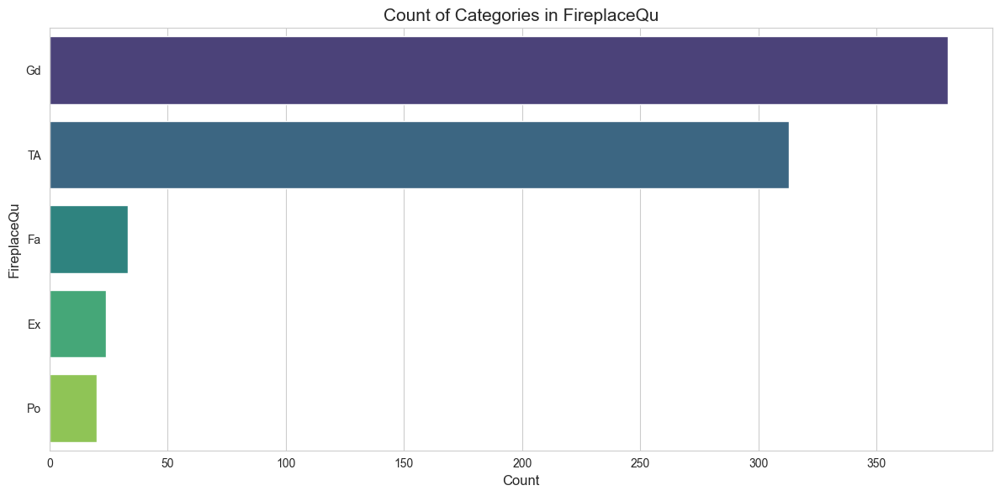


Feature: 'GarageType'
  - Number of unique categories: 6
  - Categories: ['2Types', 'Attchd', 'Basment', 'BuiltIn', 'CarPort', 'Detchd', 'nan']


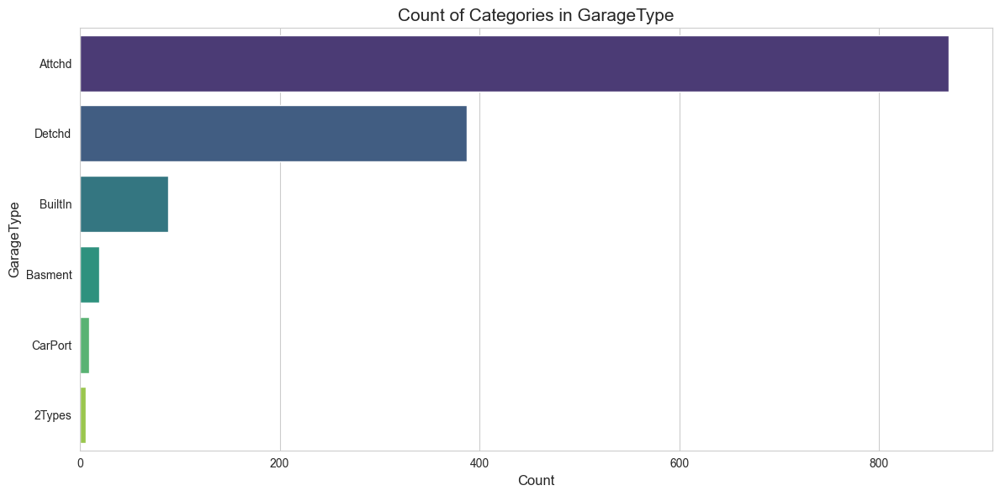


Feature: 'GarageFinish'
  - Number of unique categories: 3
  - Categories: ['Fin', 'RFn', 'Unf', 'nan']


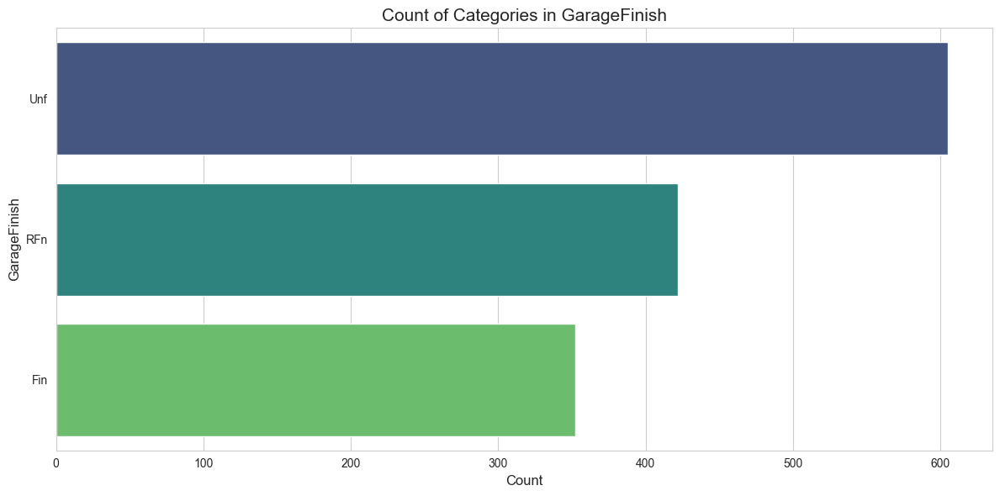


Feature: 'GarageQual'
  - Number of unique categories: 5
  - Categories: ['Ex', 'Fa', 'Gd', 'Po', 'TA', 'nan']


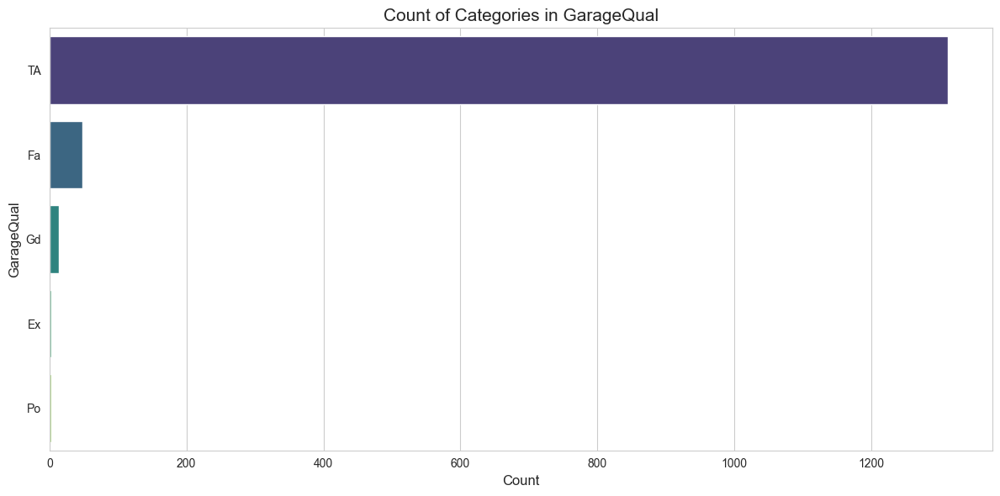


Feature: 'GarageCond'
  - Number of unique categories: 5
  - Categories: ['Ex', 'Fa', 'Gd', 'Po', 'TA', 'nan']


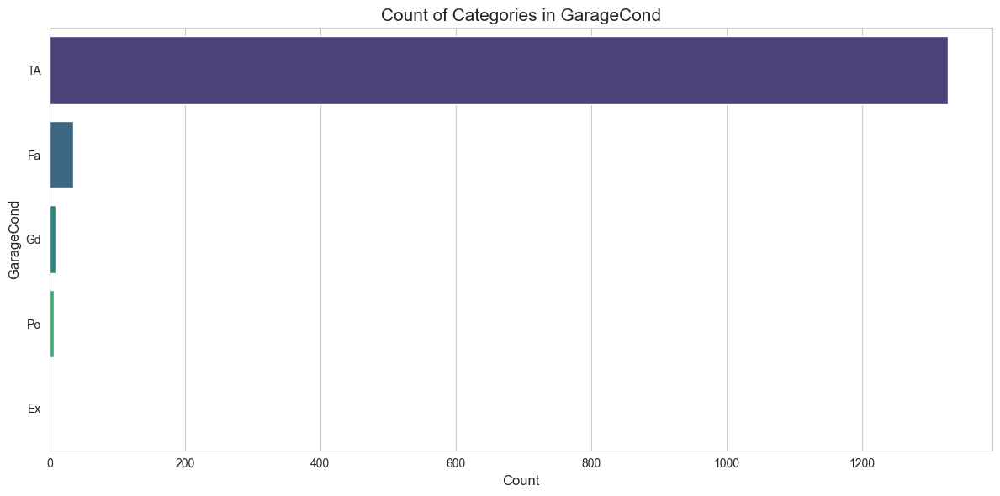


Feature: 'PavedDrive'
  - Number of unique categories: 3
  - Categories: ['N', 'P', 'Y']


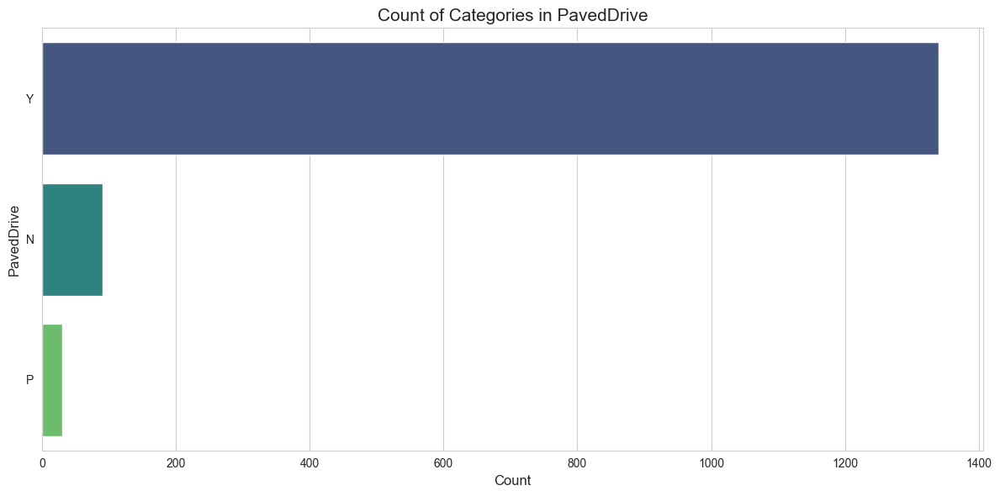


Feature: 'PoolQC'
  - Number of unique categories: 3
  - Categories: ['Ex', 'Fa', 'Gd', 'nan']


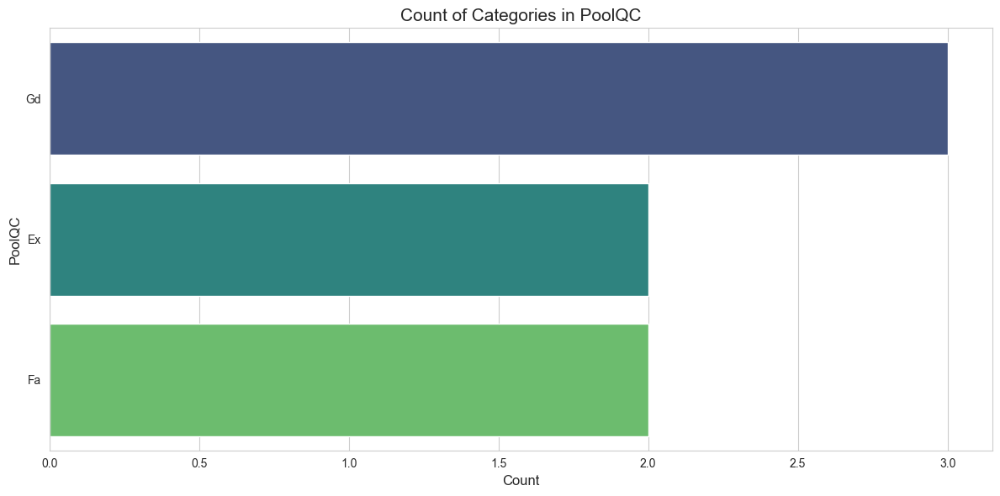


Feature: 'Fence'
  - Number of unique categories: 4
  - Categories: ['GdPrv', 'GdWo', 'MnPrv', 'MnWw', 'nan']


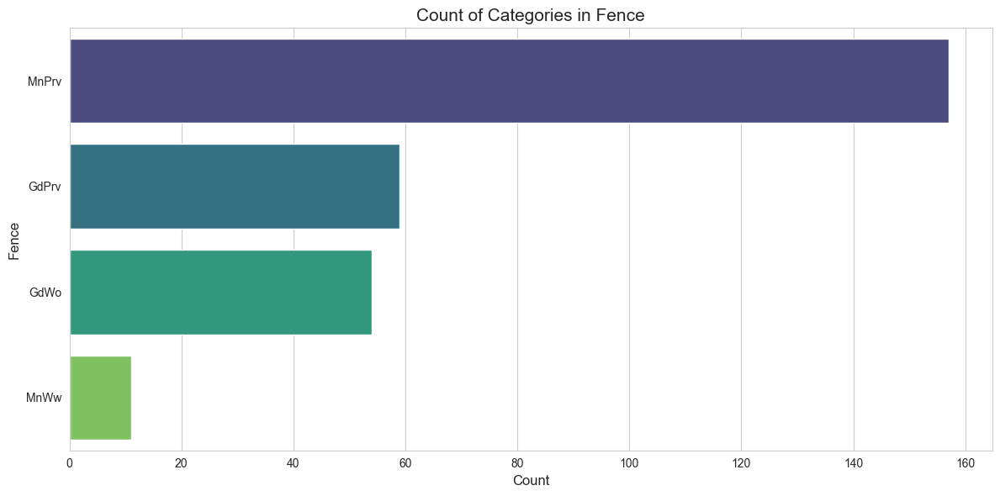


Feature: 'MiscFeature'
  - Number of unique categories: 4
  - Categories: ['Gar2', 'Othr', 'Shed', 'TenC', 'nan']


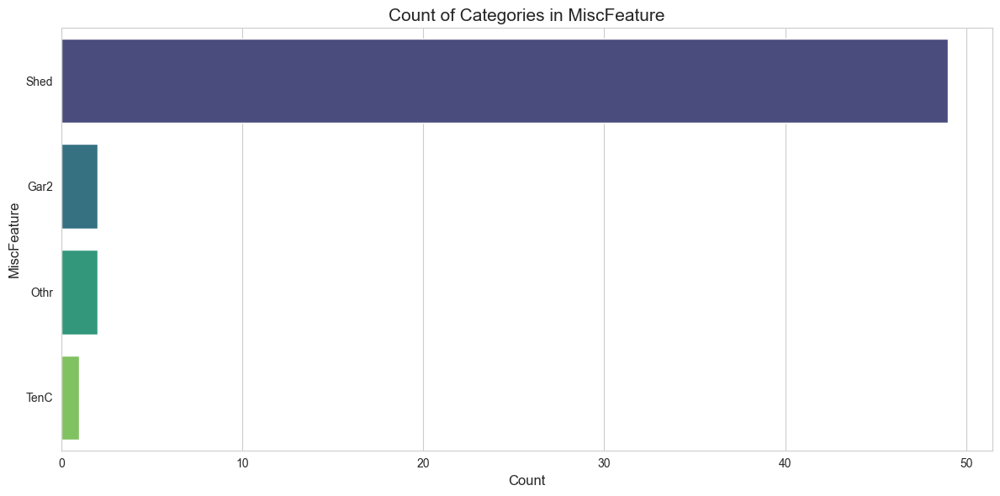


Feature: 'SaleType'
  - Number of unique categories: 9
  - Categories: ['COD', 'CWD', 'Con', 'ConLD', 'ConLI', 'ConLw', 'New', 'Oth', 'WD']


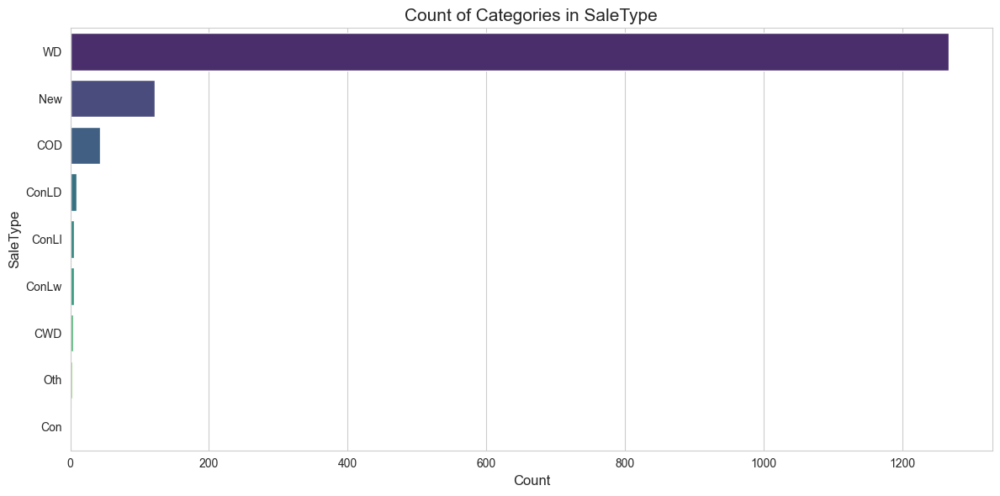


Feature: 'SaleCondition'
  - Number of unique categories: 6
  - Categories: ['Abnorml', 'AdjLand', 'Alloca', 'Family', 'Normal', 'Partial']


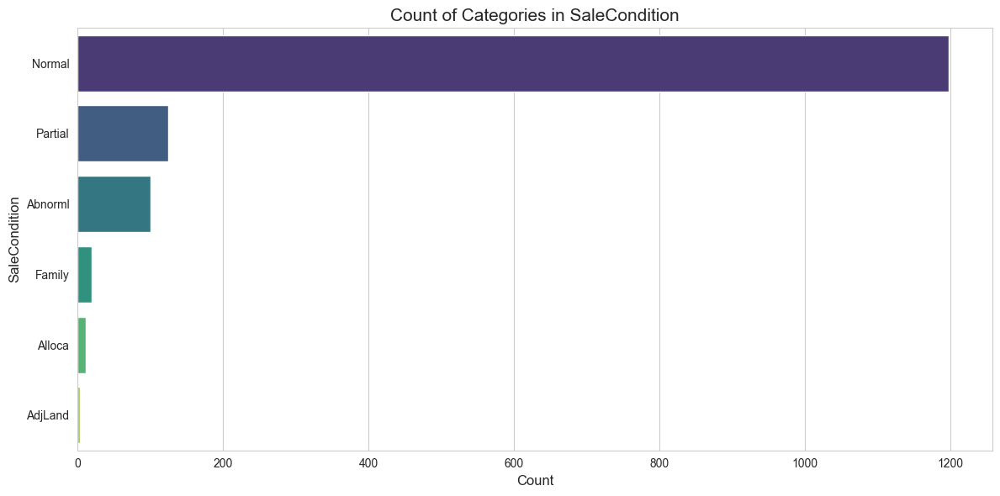


Feature: 'MSSubClass'
  - Number of unique categories: 15
  - Categories are too numerous to list here (e.g., Neighborhood).


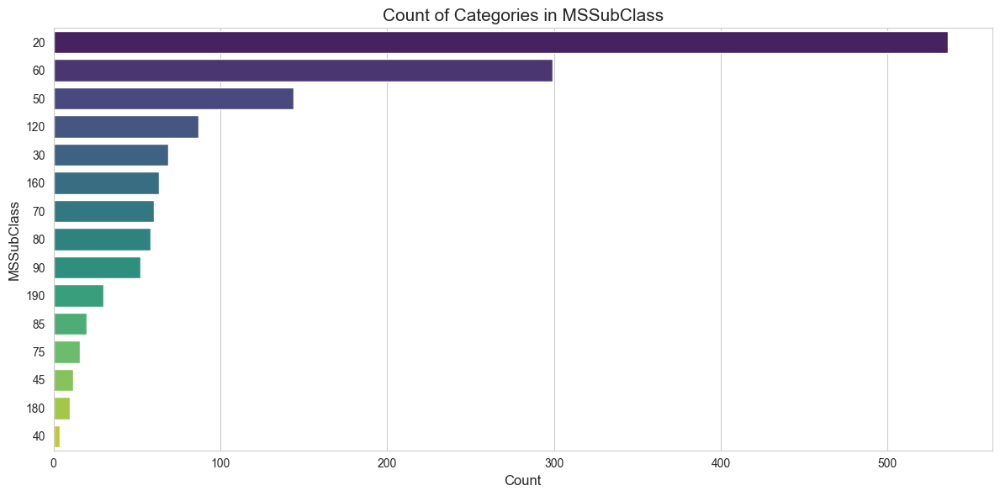


Feature: 'OverallQual'
  - Number of unique categories: 10
  - Categories: ['1', '10', '2', '3', '4', '5', '6', '7', '8', '9']


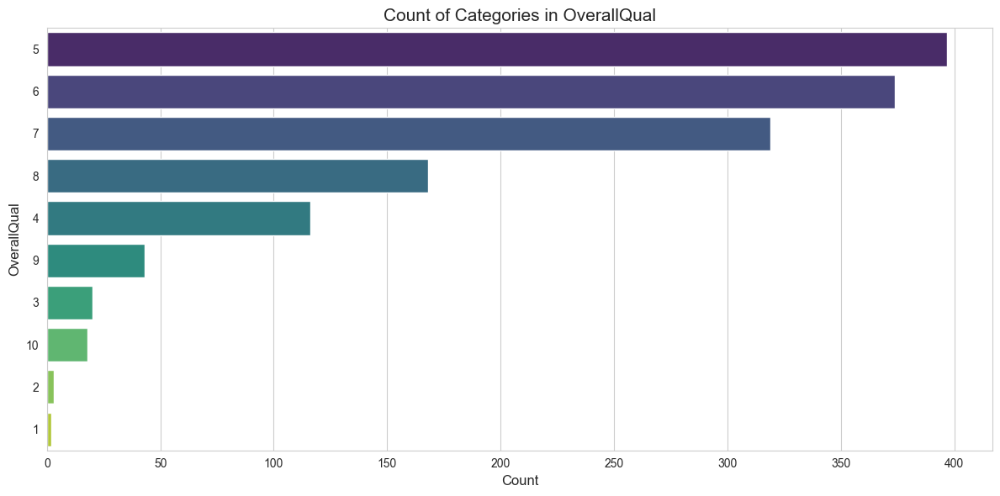


Feature: 'OverallCond'
  - Number of unique categories: 9
  - Categories: ['1', '2', '3', '4', '5', '6', '7', '8', '9']


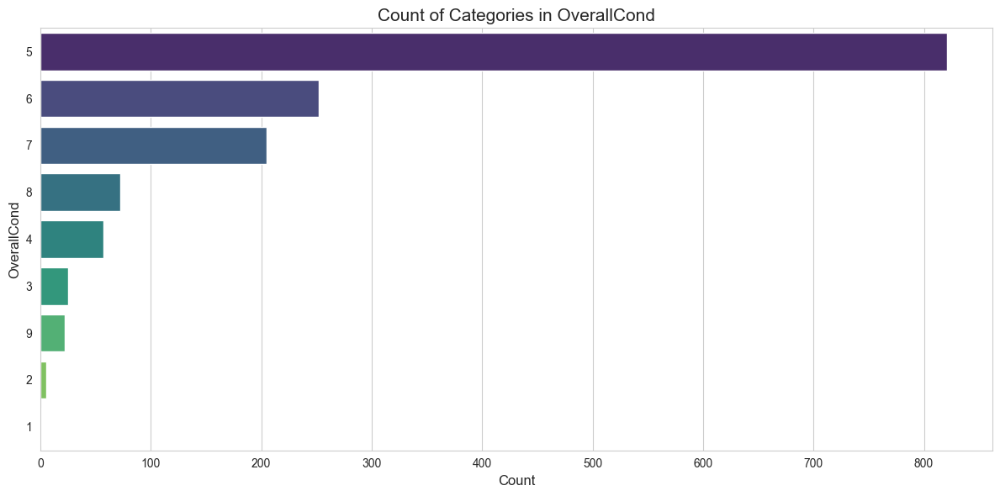


Feature: 'YrSold'
  - Number of unique categories: 5
  - Categories: ['2006', '2007', '2008', '2009', '2010']


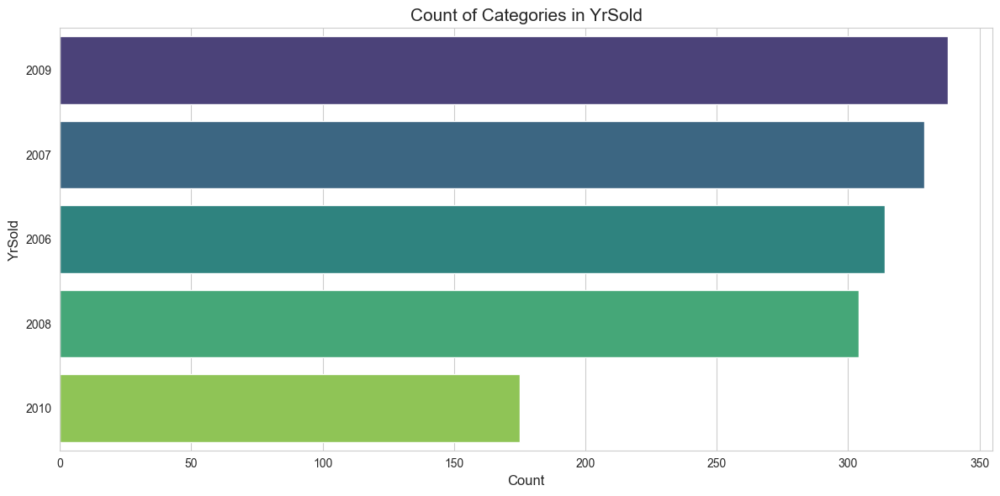


Feature: 'MoSold'
  - Number of unique categories: 12
  - Categories: ['1', '10', '11', '12', '2', '3', '4', '5', '6', '7', '8', '9']


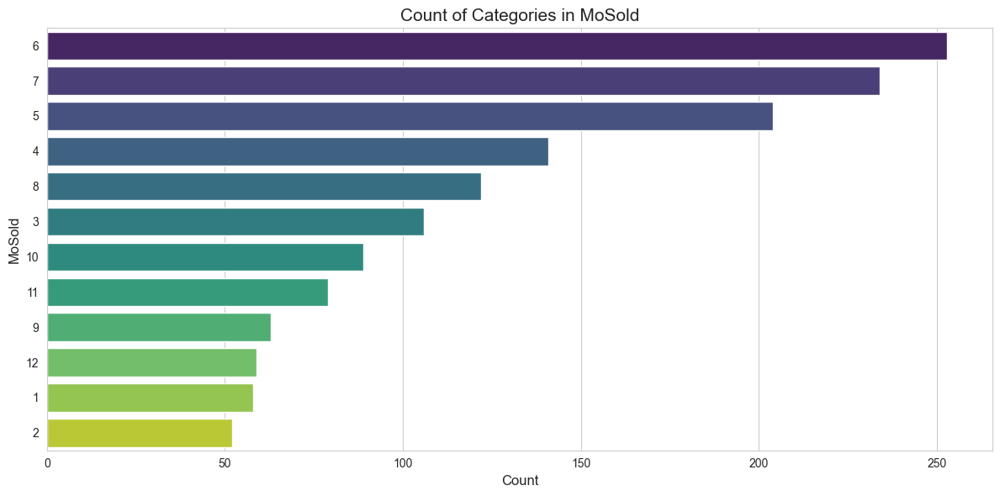

In [8]:
# 5. CATEGORICAL FEATURES ANALYSIS
# =============================================================================
print("Step 5: Analyzing categorical features (Bar Charts)...")

for feature in categorical_features:
    plt.figure(figsize=(12, 6))
    
    # Create the bar plot
    order = df_train[feature].value_counts().index
    sns.countplot(y=feature, data=df_train, order=order, palette='viridis')
    
    # Add title and information
    plt.title(f'Count of Categories in {feature}', fontsize=15)
    plt.xlabel('Count', fontsize=12)
    plt.ylabel(feature, fontsize=12)
    
    # Print unique values and their range/count
    unique_vals = df_train[feature].unique()
    num_unique = df_train[feature].nunique()
    print(f"\nFeature: '{feature}'")
    print(f"  - Number of unique categories: {num_unique}")
    if num_unique < 15: # Print all unique values if there aren't too many
        # CORRECTED LINE: Convert all items to string before sorting to handle mixed types (e.g., str and float NaN)
        print(f"  - Categories: {sorted([str(v) for v in unique_vals])}")
    else:
        print(f"  - Categories are too numerous to list here (e.g., Neighborhood).")

    plt.tight_layout()
    plt.show()

Step 5: Analyzing categorical features (Bar Charts)...

Generating a grid for 42 features with fewer than 10 categories...

Feature: 'MSZoning'
  - Number of unique categories: 5
  - Categories: ['C (all)', 'FV', 'RH', 'RL', 'RM']

Feature: 'Street'
  - Number of unique categories: 2
  - Categories: ['Grvl', 'Pave']

Feature: 'Alley'
  - Number of unique categories: 2
  - Categories: ['Grvl', 'Pave', 'nan']

Feature: 'LotShape'
  - Number of unique categories: 4
  - Categories: ['IR1', 'IR2', 'IR3', 'Reg']

Feature: 'LandContour'
  - Number of unique categories: 4
  - Categories: ['Bnk', 'HLS', 'Low', 'Lvl']

Feature: 'Utilities'
  - Number of unique categories: 2
  - Categories: ['AllPub', 'NoSeWa']

Feature: 'LotConfig'
  - Number of unique categories: 5
  - Categories: ['Corner', 'CulDSac', 'FR2', 'FR3', 'Inside']

Feature: 'LandSlope'
  - Number of unique categories: 3
  - Categories: ['Gtl', 'Mod', 'Sev']

Feature: 'Condition1'
  - Number of unique categories: 9
  - Categories: ['

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Feature: 'Fence'
  - Number of unique categories: 4
  - Categories: ['GdPrv', 'GdWo', 'MnPrv', 'MnWw', 'nan']

Feature: 'MiscFeature'
  - Number of unique categories: 4
  - Categories: ['Gar2', 'Othr', 'Shed', 'TenC', 'nan']

Feature: 'SaleType'
  - Number of unique categories: 9
  - Categories: ['COD', 'CWD', 'Con', 'ConLD', 'ConLI', 'ConLw', 'New', 'Oth', 'WD']

Feature: 'SaleCondition'
  - Number of unique categories: 6
  - Categories: ['Abnorml', 'AdjLand', 'Alloca', 'Family', 'Normal', 'Partial']

Feature: 'OverallCond'
  - Number of unique categories: 9
  - Categories: ['1', '2', '3', '4', '5', '6', '7', '8', '9']

Feature: 'YrSold'
  - Number of unique categories: 5
  - Categories: ['2006', '2007', '2008', '2009', '2010']


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

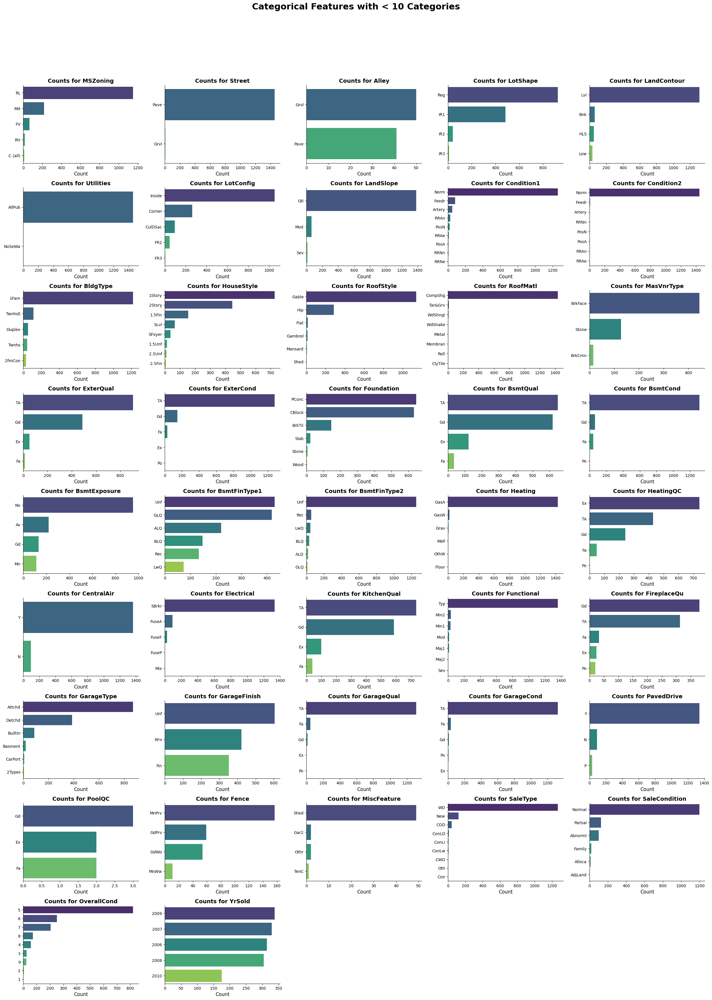

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Generating individual plots for 6 features with 10 or more categories...

Feature: 'Neighborhood'
  - Number of unique categories: 25
  - Categories are too numerous to list here.


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia


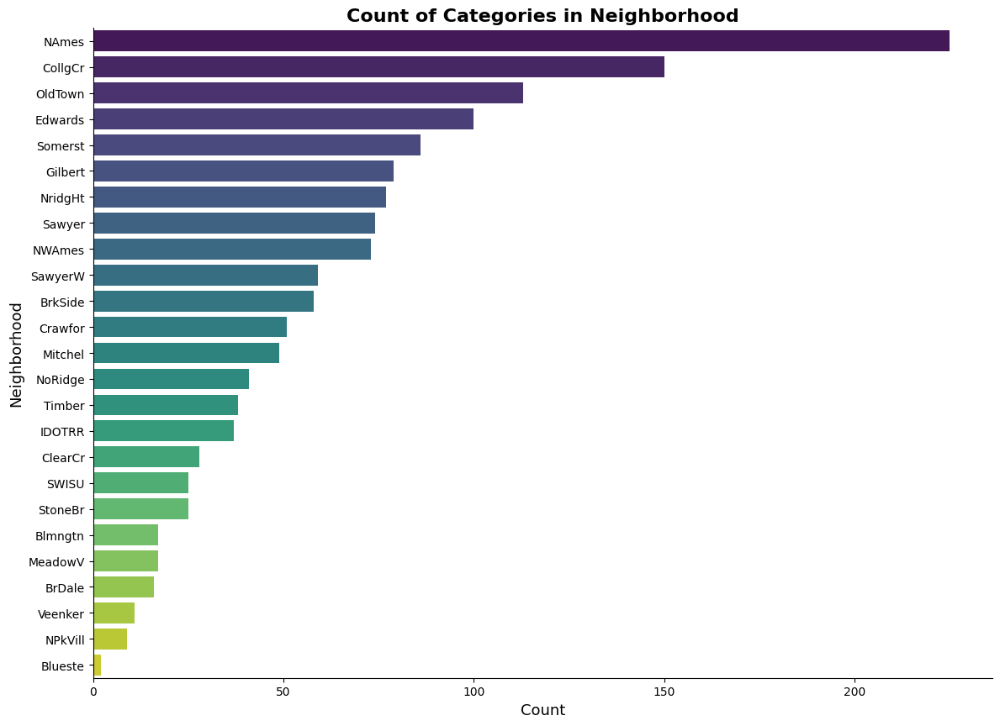

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Feature: 'Exterior1st'
  - Number of unique categories: 15
  - Categories are too numerous to list here.


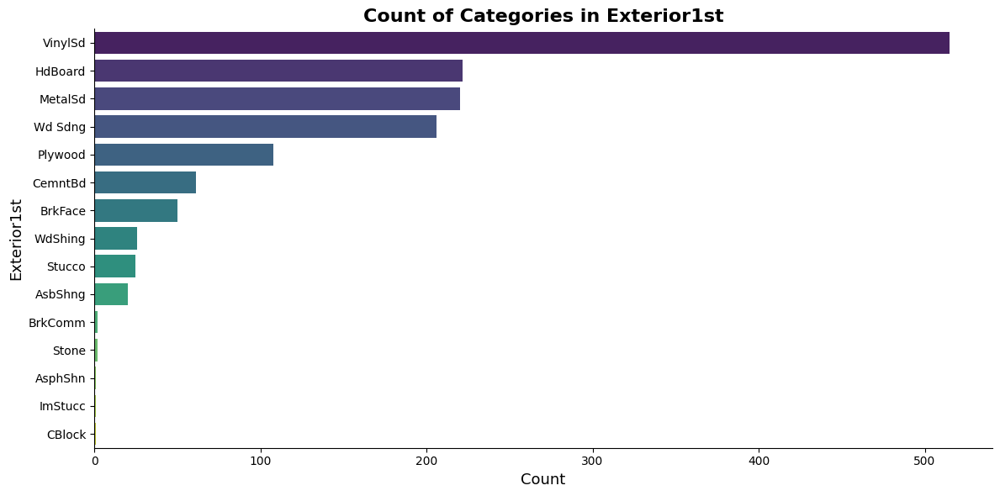

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Feature: 'Exterior2nd'
  - Number of unique categories: 16
  - Categories are too numerous to list here.


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

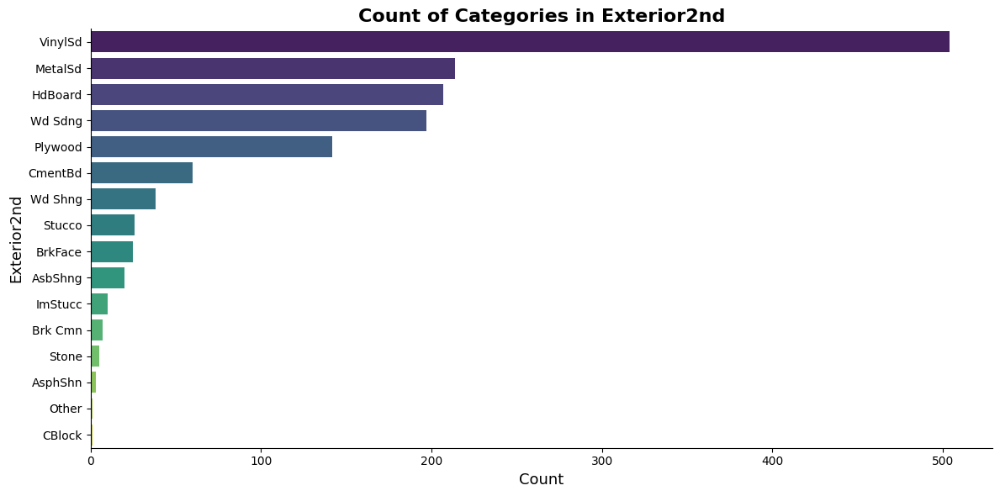

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Feature: 'MSSubClass'
  - Number of unique categories: 15
  - Categories are too numerous to list here.


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

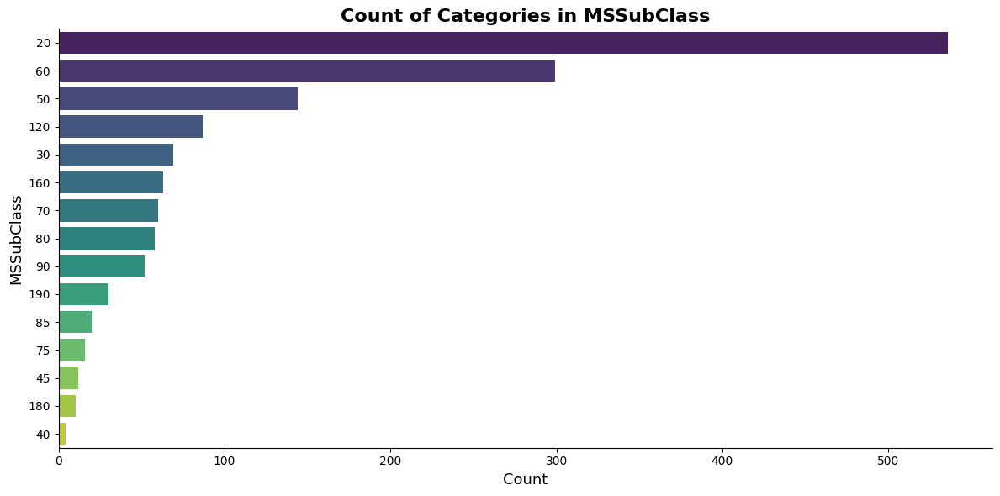

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Feature: 'OverallQual'
  - Number of unique categories: 10
  - Categories are too numerous to list here.


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

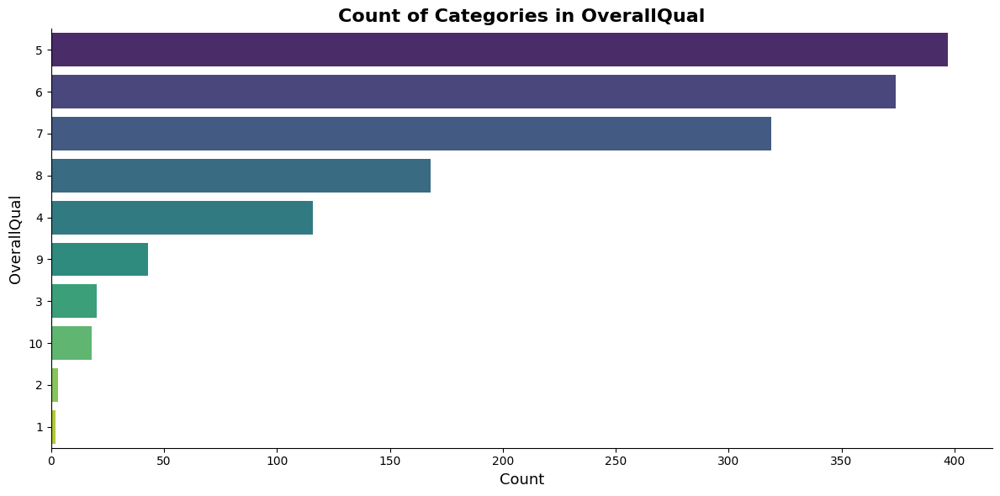

findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 


Feature: 'MoSold'
  - Number of unique categories: 12
  - Categories are too numerous to list here.


findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families were found: Georgia
findfont: Generic family 'serif' not found because none of the following families 

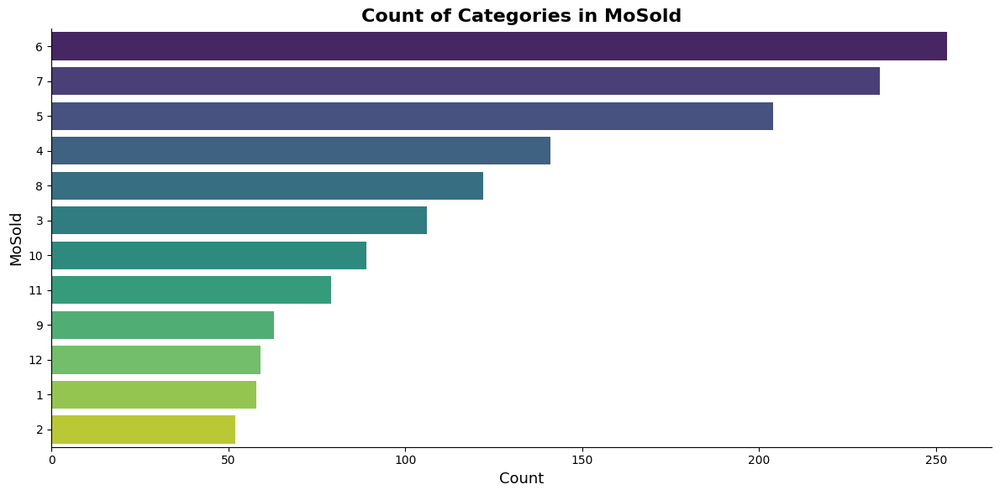

In [5]:
# 5. CATEGORICAL FEATURES ANALYSIS
# =============================================================================
print("Step 5: Analyzing categorical features (Bar Charts)...")

# --- AESTHETIC SETTINGS ---
# Set the elegant 'Georgia' font for all plots in this section
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Georgia'
# ---------------------------

# --- STRATEGY: Split features into two groups for better visualization ---
# Group 1: Features with few categories, suitable for a grid.
# Group 2: Features with many categories, requiring individual plots.
large_category_threshold = 10
small_cat_features = [f for f in categorical_features if df_train[f].nunique() < large_category_threshold]
large_cat_features = [f for f in categorical_features if df_train[f].nunique() >= large_category_threshold]


# --- PART 1: Plot features with FEW categories in a single grid ---
if small_cat_features:
    print(f"\nGenerating a grid for {len(small_cat_features)} features with fewer than {large_category_threshold} categories...")
    
    import math
    num_plots = len(small_cat_features)
    cols = 5  # Use 5 columns so there are 5 plots per row
    rows = math.ceil(num_plots / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(25, rows * 3.8))
    # Ensure axes is a 1-D array for easy iteration
    axes = axes.flatten() if hasattr(axes, 'flatten') else np.array([axes])

    for i, feature in enumerate(small_cat_features):
        ax = axes[i]
        
        # Create the bar plot
        order = df_train[feature].value_counts().index
        sns.countplot(y=feature, data=df_train, order=order, palette='viridis', ax=ax)
        
        # Add title and clean up
        ax.set_title(f'Counts for {feature}', fontsize=14, fontweight='bold')
        ax.set_xlabel('Count', fontsize=12)
        ax.set_ylabel('') # Y-label is clear from the ticks
        sns.despine(ax=ax)
        
        # Print info in the console
        unique_vals = df_train[feature].unique()
        num_unique = df_train[feature].nunique()
        print(f"\nFeature: '{feature}'")
        print(f"  - Number of unique categories: {num_unique}")
        print(f"  - Categories: {sorted([str(v) for v in unique_vals])}")

    # Hide unused subplots
    for i in range(num_plots, len(axes)):
        axes[i].set_visible(False)
        
    fig.suptitle(f'Categorical Features with < {large_category_threshold} Categories', fontsize=22, fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# --- PART 2: Plot features with MANY categories individually ---
if large_cat_features:
    print(f"\nGenerating individual plots for {len(large_cat_features)} features with {large_category_threshold} or more categories...")
    
    for feature in large_cat_features:
        num_unique = df_train[feature].nunique()
        # Dynamically adjust figure height based on the number of categories
        fig_height = max(6, num_unique * 0.35)
        
        plt.figure(figsize=(12, fig_height))
        
        # Create the bar plot
        order = df_train[feature].value_counts().index
        sns.countplot(y=feature, data=df_train, order=order, palette='viridis')
        
        # Add title and information
        plt.title(f'Count of Categories in {feature}', fontsize=16, fontweight='bold')
        plt.xlabel('Count', fontsize=13)
        plt.ylabel(feature, fontsize=13)
        sns.despine()
        
        # Print info in the console
        print(f"\nFeature: '{feature}'")
        print(f"  - Number of unique categories: {num_unique}")
        print(f"  - Categories are too numerous to list here.")
        
        plt.tight_layout()
        plt.show()

# Reset font settings to default
plt.rcParams.update(plt.rcParamsDefault)

Step 6: Generating advanced visualizations for deeper insights...

6.1. Correlation Heatmaps of Numerical Features


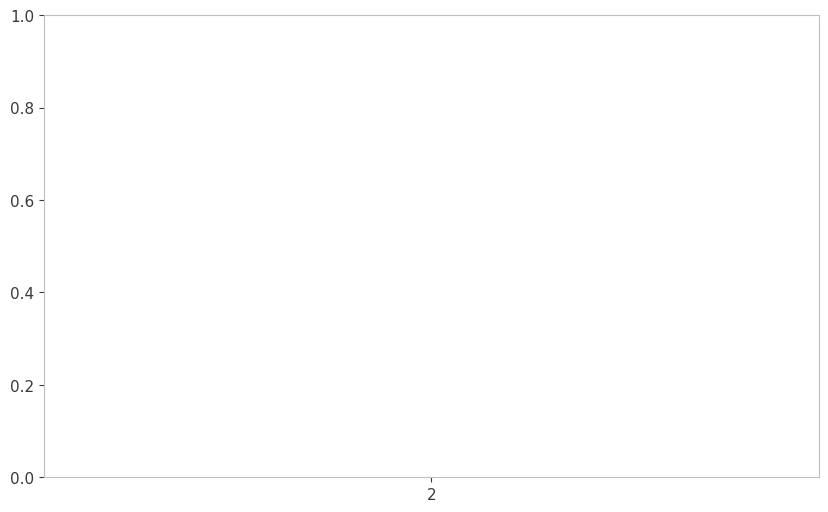

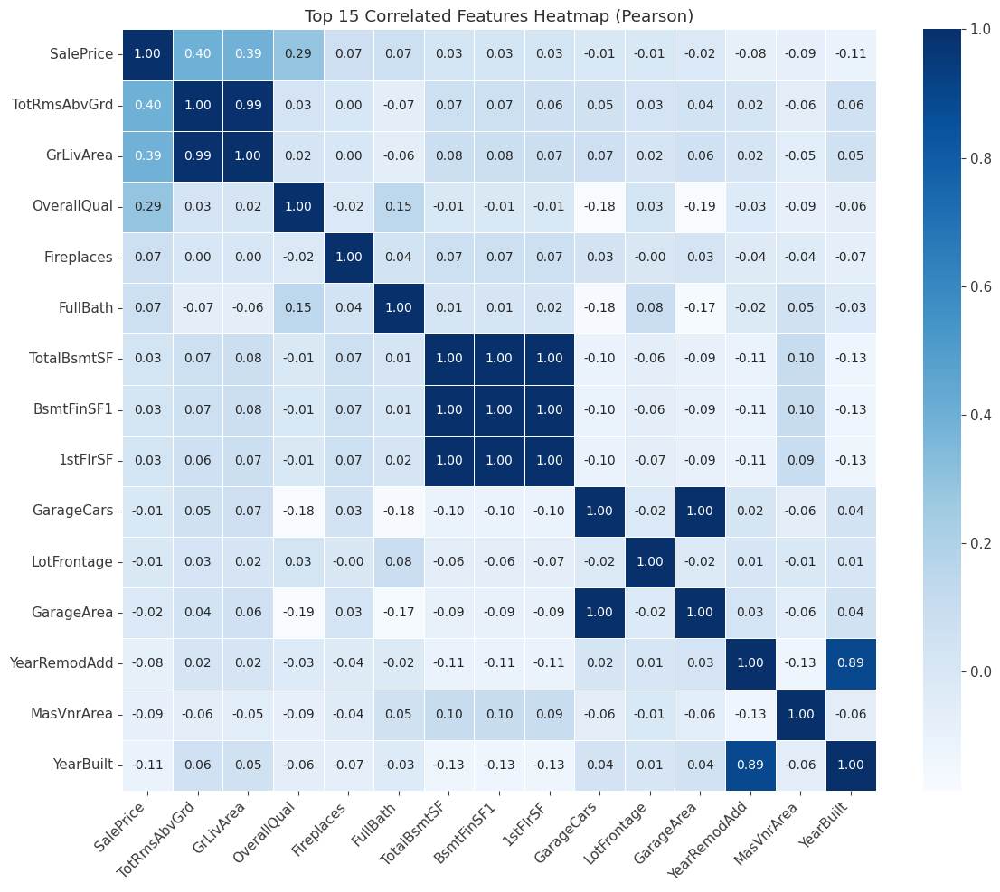

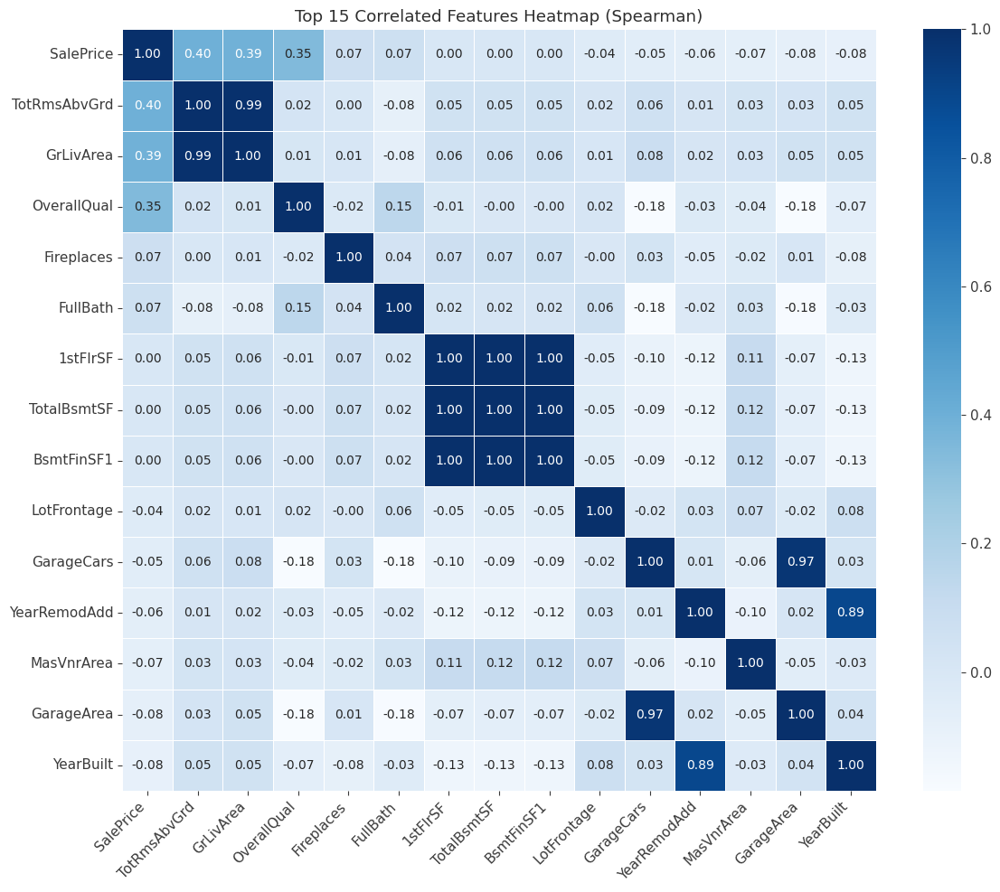

Heatmaps show strong multicollinearity. Comparing Pearson (linear) and Spearman (monotonic) can reveal non-linear relationships.

6.2. Missing Value Analysis
Features with missing values:
             Total  Percent
PoolQC         200     1.00
MiscFeature    190     0.95
Alley          180     0.90
Fence          160     0.80


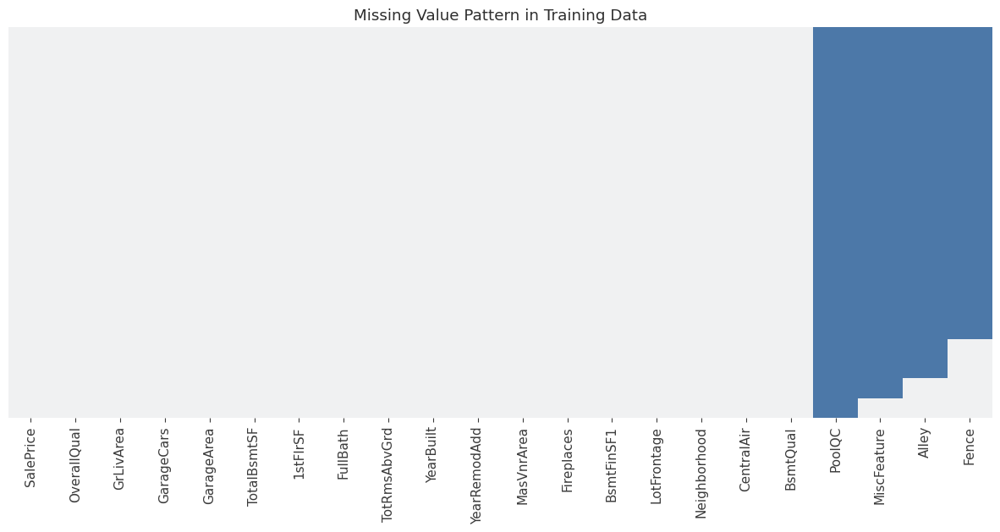

Features like 'PoolQC', 'MiscFeature', 'Alley', and 'Fence' have a very high percentage of missing values. This often means the absence of the feature (e.g., no pool).

6.3. Scatter plots of top numerical features vs. SalePrice


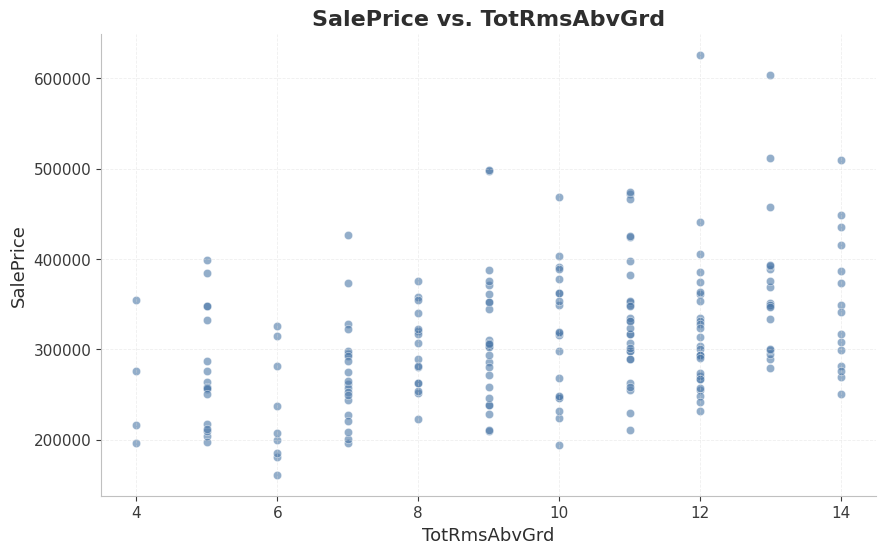

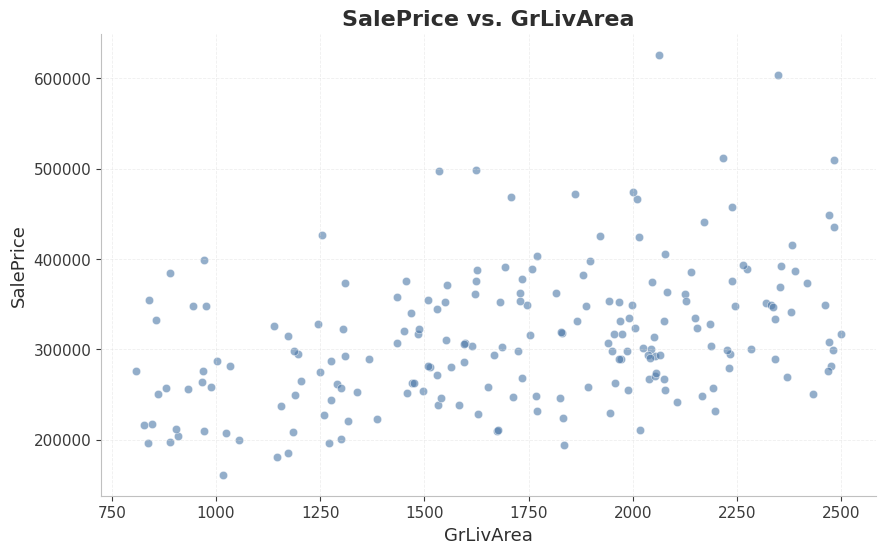

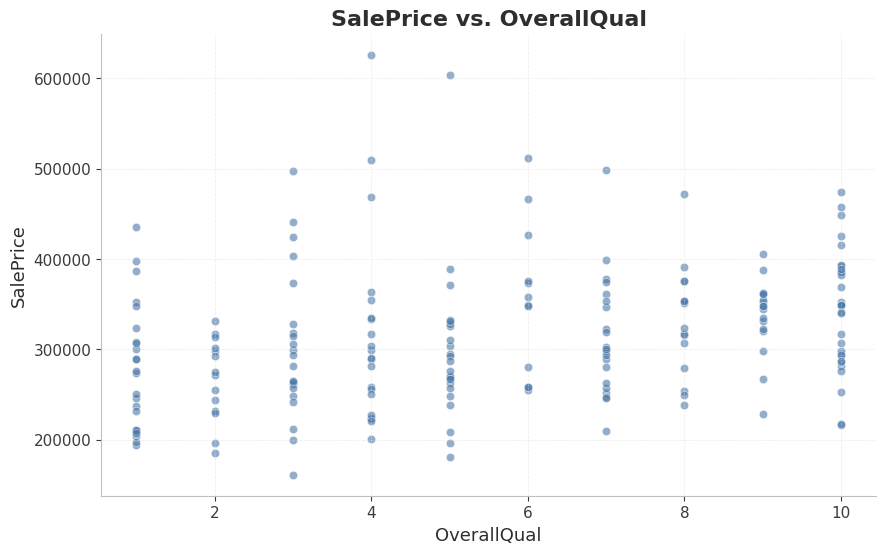

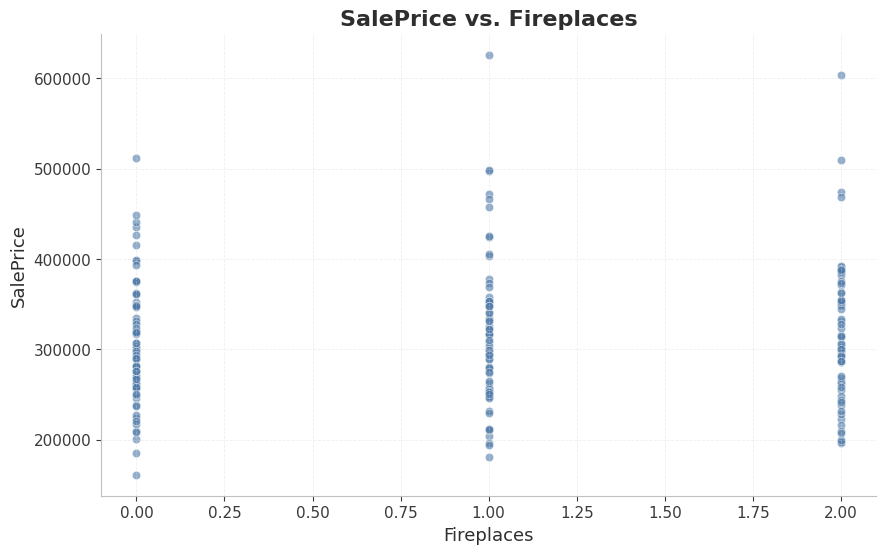

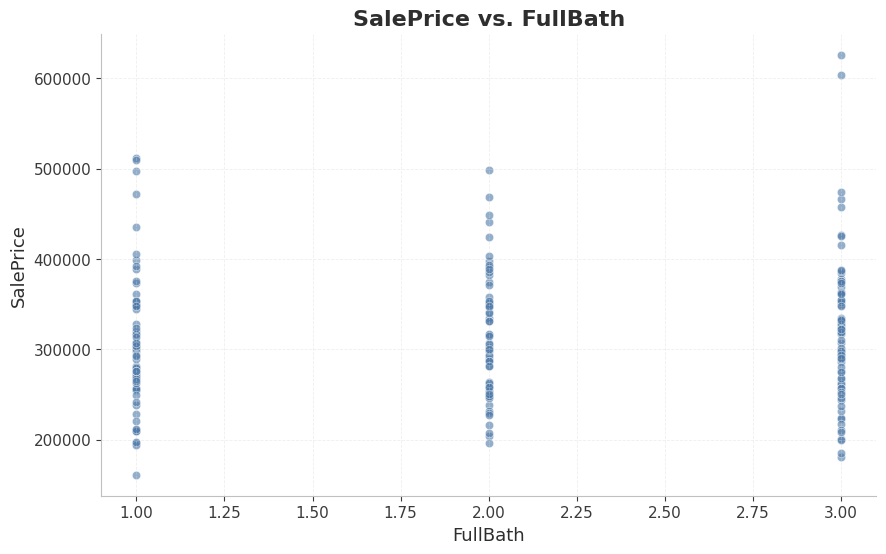

Scatter plots reveal relationships. For example, 'GrLivArea' shows a clear positive linear relationship with 'SalePrice'. We can also spot potential outliers.

6.4. Box plots of important categorical features vs. SalePrice


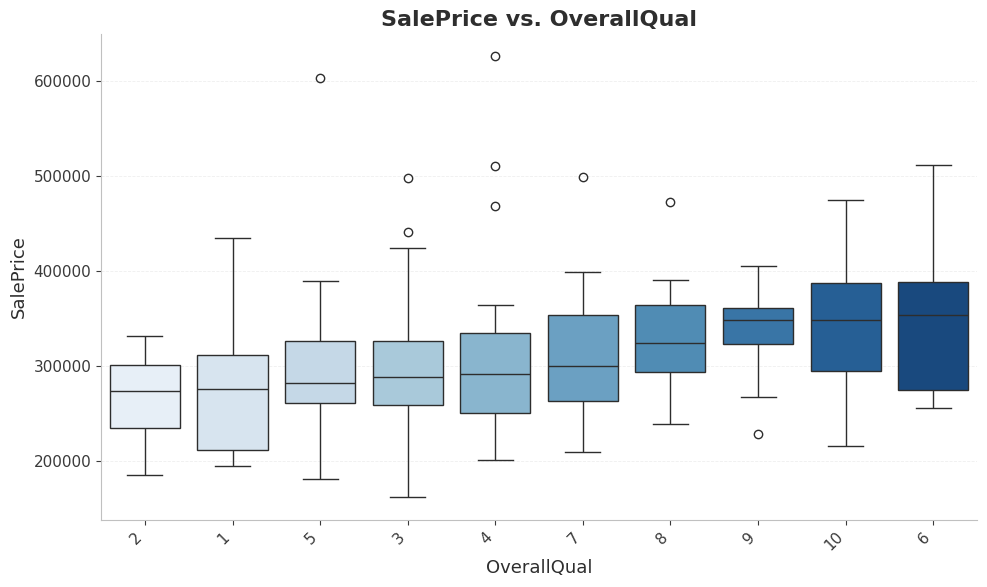

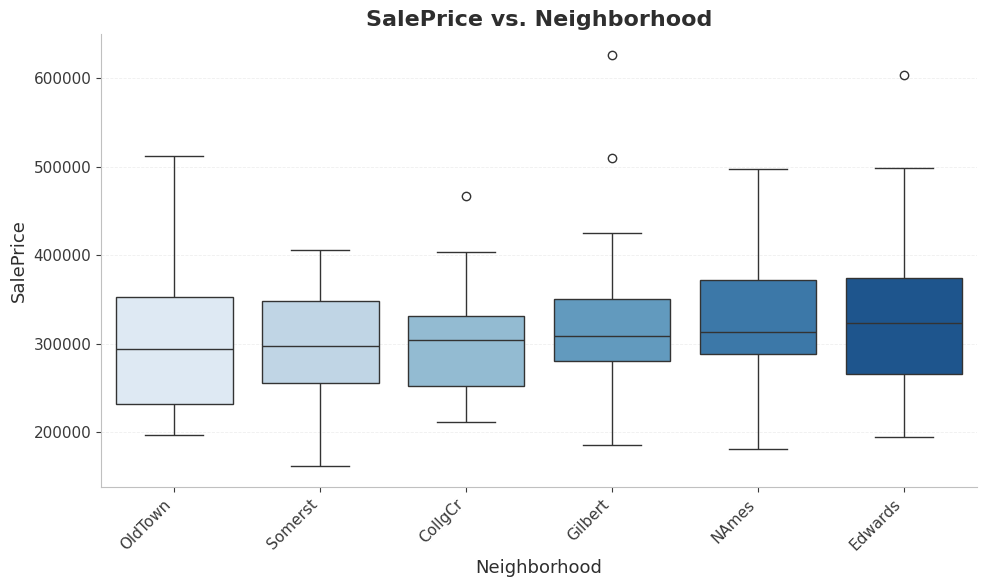

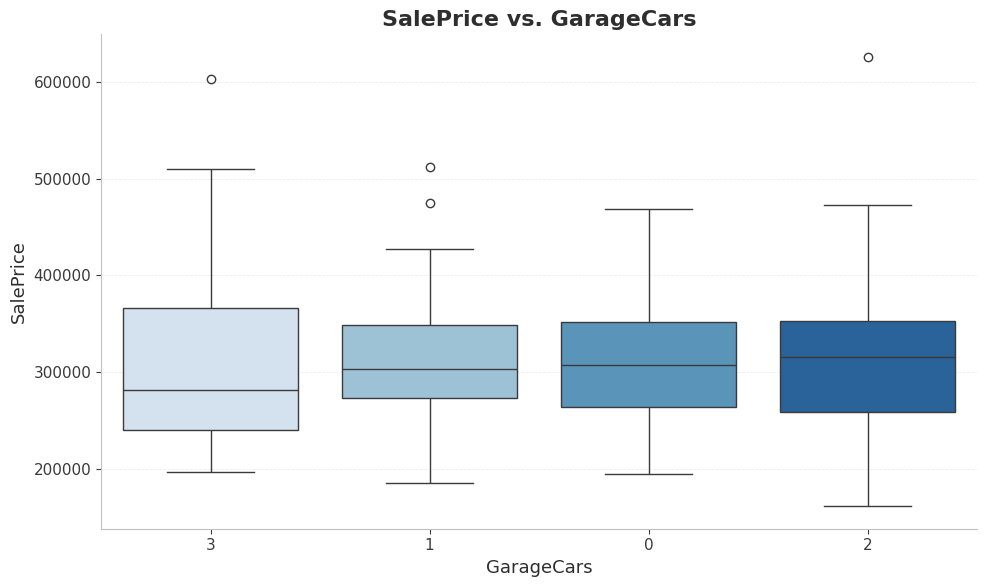

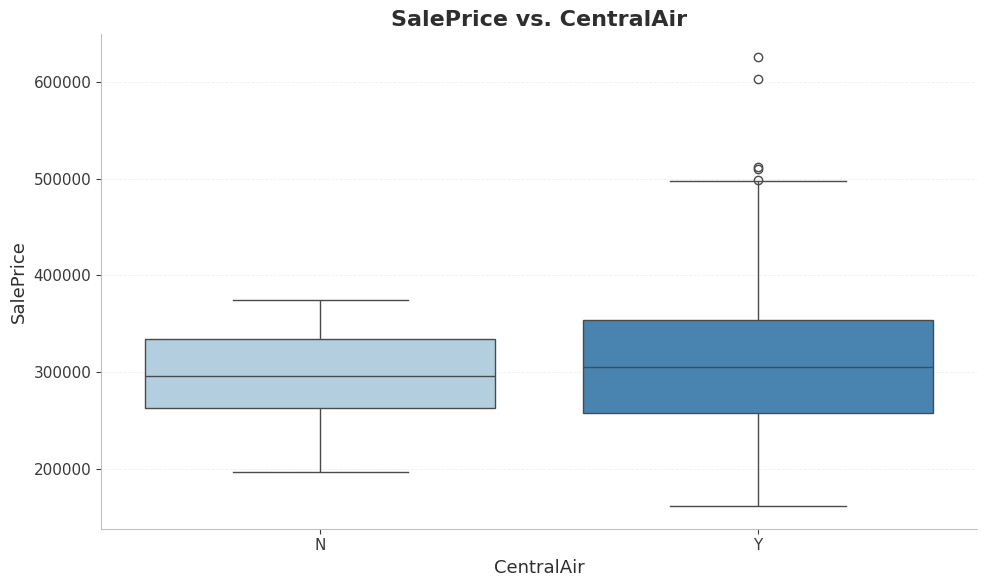

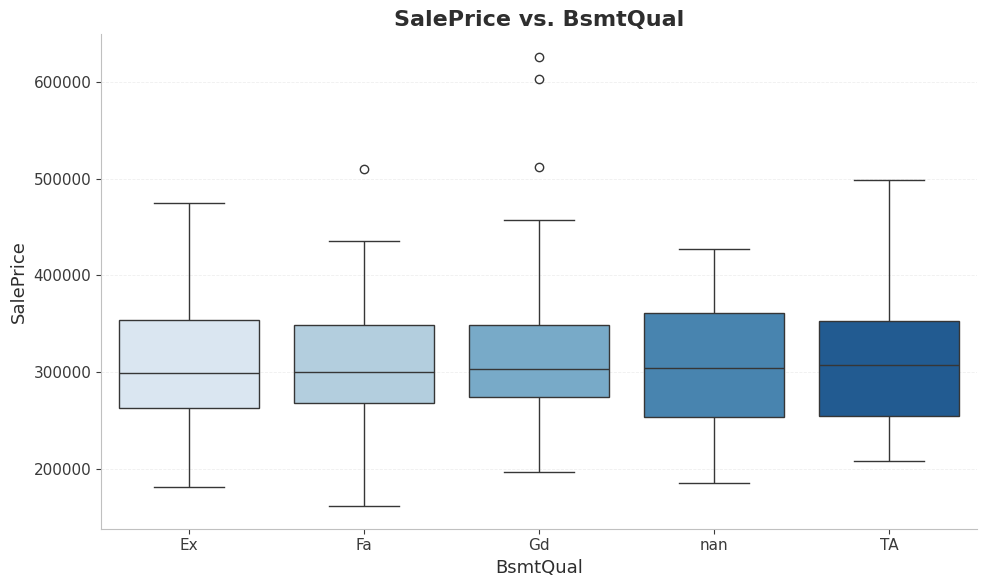

Box plots clearly show how different categories impact the house price. 'OverallQual' has a very strong, positive monotonic relationship with 'SalePrice'.

Visualization script finished. Matplotlib settings have been reset to default.


In [18]:
# =============================================================================
# 6. ADVANCED VISUALIZATION & DEEPER INSIGHTS (RE-STYLED IN BLUE TONES)
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# --- 假设 df_train, pearson_corr, spearman_corr 已经存在 ---
# 为了使代码可独立运行，我们创建一些模拟数据。
# 在您的实际使用中，请删除或注释掉这部分模拟数据代码。
np.random.seed(42)
data = {
    'SalePrice': np.random.lognormal(12, 0.4, 200),
    'OverallQual': np.random.randint(1, 11, 200),
    'GrLivArea': np.random.randint(800, 2500, 200),
    'GarageCars': np.random.randint(0, 4, 200),
    'GarageArea': lambda df: df['GarageCars'] * np.random.randint(180, 220) + np.random.normal(0, 20, 200),
    'TotalBsmtSF': np.random.randint(500, 2000, 200),
    '1stFlrSF': lambda df: df['TotalBsmtSF'] * np.random.uniform(0.8, 1.0) - np.random.normal(0, 30, 200),
    'FullBath': np.random.randint(1, 4, 200),
    'TotRmsAbvGrd': lambda df: df['GrLivArea'] / np.random.randint(150, 200),
    'YearBuilt': np.random.randint(1950, 2010, 200),
    'YearRemodAdd': lambda df: df['YearBuilt'] + np.random.randint(0, 30, 200),
    'MasVnrArea': np.random.gamma(2, 50, 200),
    'Fireplaces': np.random.randint(0, 3, 200),
    'BsmtFinSF1': lambda df: df['TotalBsmtSF'] * np.random.uniform(0.4, 0.8),
    'LotFrontage': np.random.gamma(4, 20, 200),
    'Neighborhood': np.random.choice(['NAmes', 'CollgCr', 'OldTown', 'Edwards', 'Somerst', 'Gilbert'], 200),
    'CentralAir': np.random.choice(['Y', 'N'], 200, p=[0.9, 0.1]),
    'BsmtQual': np.random.choice(['Ex', 'Gd', 'TA', 'Fa', np.nan], 200, p=[0.2, 0.3, 0.3, 0.1, 0.1]),
    'PoolQC': [np.nan] * 200,
    'MiscFeature': [np.nan] * 190 + ['Shed'] * 10,
    'Alley': [np.nan] * 180 + ['Grvl'] * 20,
    'Fence': [np.nan] * 160 + ['MnPrv'] * 40,
}
df_train = pd.DataFrame(data)
# 处理函数生成的列
for col, func in data.items():
    if callable(func):
        df_train[col] = func(df_train)
df_train['SalePrice'] = df_train['SalePrice'] + df_train['OverallQual']*10000 + df_train['GrLivArea']*50
df_train['GarageArea'] = df_train['GarageArea'].clip(0)
df_train['TotRmsAbvGrd'] = df_train['TotRmsAbvGrd'].astype(int)

# 模拟相关性系列
numerical_cols = df_train.select_dtypes(include=np.number).columns
pearson_corr = df_train[numerical_cols].corr(method='pearson')['SalePrice'].sort_values(ascending=False)
spearman_corr = df_train[numerical_cols].corr(method='spearman')['SalePrice'].sort_values(ascending=False)
# --- 模拟数据结束 ---


print("Step 6: Generating advanced visualizations for deeper insights...")

# --- AESTHETIC CONFIGURATION (ADOPTED FROM TARGET STYLE) ---
# 1. 全局样式设置
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#C0C0C0",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#2E2E2E",
    "xtick.color": "#3A3A3A",
    "ytick.color": "#3A3A3A",
    "grid.color": "#D7D7D7",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.5,
    "font.size": 11,
    "font.family": "DejaVu Sans", # 使用一个清晰且广泛可用的无衬线字体
    "figure.titlesize": 18,
    "figure.titleweight": "bold",
})

# 2. 自定义颜色方案
# 主色调（用于散点图等）
c_primary = "#4C78A8"

# --- CHANGED: 使用纯蓝色顺序调色板 ---
# 为热图和箱线图创建一个单色顺序调色板 (从浅蓝到深蓝)
# 这取代了之前的 红-白-蓝 发散色板，以满足“全蓝色调”的要求。
# "Blues" 是一个内置的、效果很好的选择。
blue_sequential_cmap = "Blues"

# 为缺失值图创建一个顺序色板 (保持不变，因为它已经是蓝色系)
missing_cmap = sns.light_palette(c_primary, as_cmap=True)
# -----------------------------------------------------------------------------


# 6.1. Correlation Heatmaps (Pearson & Spearman)
# -----------------------------------------------------------------------------
print("\n6.1. Correlation Heatmaps of Numerical Features")
top_k = 15 # number of variables for heatmap

# --- Pearson Heatmap ---
top_pearson_cols = pearson_corr.nlargest(top_k).index
corr_matrix_pearson = df_train[top_pearson_cols].corr(method='pearson')

plt.figure(figsize=(12, 10))
# --- CHANGED: 使用新的纯蓝色调色板 ---
sns.heatmap(corr_matrix_pearson, annot=True, cmap=blue_sequential_cmap, fmt=".2f", linewidths=.5, annot_kws={"size": 10})
plt.title(f'Top {top_k} Correlated Features Heatmap (Pearson)', color="#2E2E2E")
plt.xticks(fontsize=11, rotation=45, ha='right')
plt.yticks(fontsize=11)
plt.tight_layout()
plt.show()

# --- Spearman Heatmap ---
top_spearman_cols = spearman_corr.nlargest(top_k).index
corr_matrix_spearman = df_train[top_spearman_cols].corr(method='spearman')

plt.figure(figsize=(12, 10))
# --- CHANGED: 使用新的纯蓝色调色板 ---
sns.heatmap(corr_matrix_spearman, annot=True, cmap=blue_sequential_cmap, fmt=".2f", linewidths=.5, annot_kws={"size": 10})
plt.title(f'Top {top_k} Correlated Features Heatmap (Spearman)', color="#2E2E2E")
plt.xticks(fontsize=11, rotation=45, ha='right')
plt.yticks(fontsize=11)
plt.tight_layout()
plt.show()

print("Heatmaps show strong multicollinearity. Comparing Pearson (linear) and Spearman (monotonic) can reveal non-linear relationships.")


# 6.2. Missing Value Analysis
# -----------------------------------------------------------------------------
print("\n6.2. Missing Value Analysis")
total_missing = df_train.isnull().sum().sort_values(ascending=False)
percent_missing = (df_train.isnull().sum() / df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total_missing, percent_missing], axis=1, keys=['Total', 'Percent'])

print("Features with missing values:")
print(missing_data[missing_data['Total'] > 0])

# Visualize the missing data pattern
plt.figure(figsize=(15, 6))
sns.heatmap(df_train.isnull(), cbar=False, cmap=missing_cmap, yticklabels=False)
plt.title('Missing Value Pattern in Training Data', color="#2E2E2E")
plt.show()
print("Features like 'PoolQC', 'MiscFeature', 'Alley', and 'Fence' have a very high percentage of missing values. This often means the absence of the feature (e.g., no pool).")


# 6.3. Key Features vs. Target Variable (Scatter Plots)
# -----------------------------------------------------------------------------
print("\n6.3. Scatter plots of top numerical features vs. SalePrice")
top_scatter_features = pearson_corr.nlargest(6).index.drop('SalePrice')

for feature in top_scatter_features:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df_train[feature], y=df_train['SalePrice'], alpha=0.6, color=c_primary)
    plt.title(f'SalePrice vs. {feature}', fontsize=16, fontweight='bold', color="#2E2E2E")
    plt.xlabel(feature, fontsize=13)
    plt.ylabel('SalePrice', fontsize=13)
    sns.despine()
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.show()
print("Scatter plots reveal relationships. For example, 'GrLivArea' shows a clear positive linear relationship with 'SalePrice'. We can also spot potential outliers.")


# 6.4. Key Features vs. Target Variable (Box Plots)
# -----------------------------------------------------------------------------
print("\n6.4. Box plots of important categorical features vs. SalePrice")
box_plot_features = ['OverallQual', 'Neighborhood', 'GarageCars', 'CentralAir', 'BsmtQual']

for feature in box_plot_features:
    # 过滤掉缺失值以进行排序
    valid_data = df_train.dropna(subset=[feature, 'SalePrice'])
    
    if valid_data[feature].nunique() > 10:
        fig_size = (18, 8)
    else:
        fig_size = (10, 6)
        
    plt.figure(figsize=fig_size)
    
    # 按中位数排序
    order = valid_data.groupby(feature)['SalePrice'].median().sort_values().index
    
    # --- CHANGED: 使用新的纯蓝色调色板 ---
    sns.boxplot(x=feature, y='SalePrice', data=valid_data, order=order, palette=blue_sequential_cmap)
    
    plt.title(f'SalePrice vs. {feature}', fontsize=16, fontweight='bold', color="#2E2E2E")
    plt.xlabel(feature, fontsize=13)
    plt.ylabel('SalePrice', fontsize=13)
    sns.despine()
    plt.grid(True, axis='y', linestyle='--', alpha=0.4)
    if valid_data[feature].nunique() > 5:
        plt.xticks(rotation=45, ha='right', fontsize=11)
    plt.tight_layout()
    plt.show()
print("Box plots clearly show how different categories impact the house price. 'OverallQual' has a very strong, positive monotonic relationship with 'SalePrice'.")


# Reset font settings to default for any subsequent plots outside this script
plt.rcParams.update(plt.rcParamsDefault)
print("\nVisualization script finished. Matplotlib settings have been reset to default.")

真实数据加载成功。
训练集形状: (1460, 81)
测试集形状: (1459, 80)

找到 36 个数值特征。
找到 43 个类别特征，其中 40 个的唯一值少于10个，将被绘制。

正在生成数值特征Distrubution图...


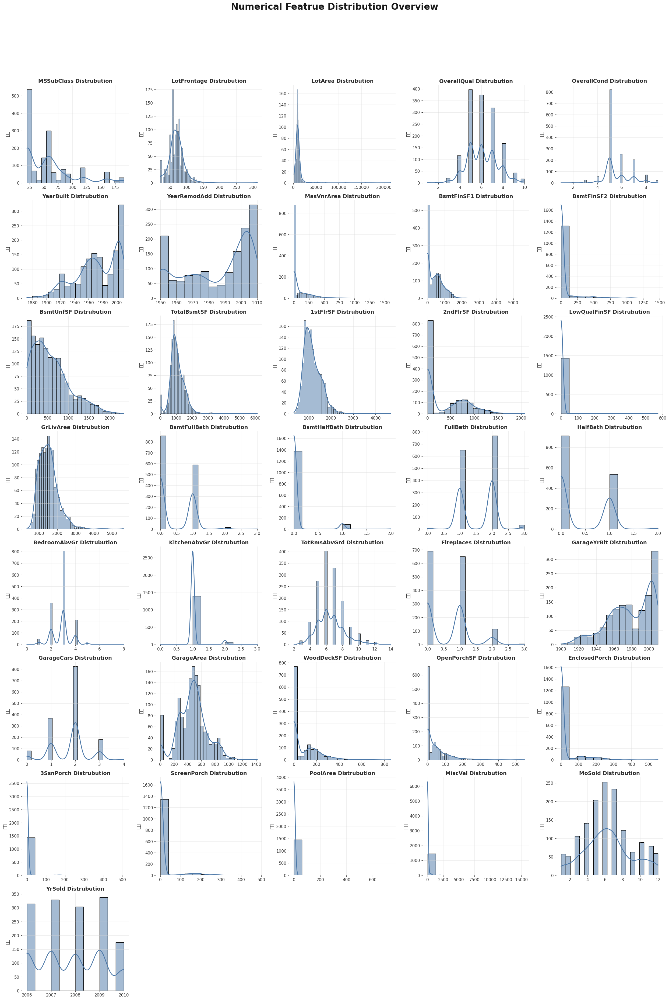


正在生成类别特征 (类别数 < 10) Distrubution图...


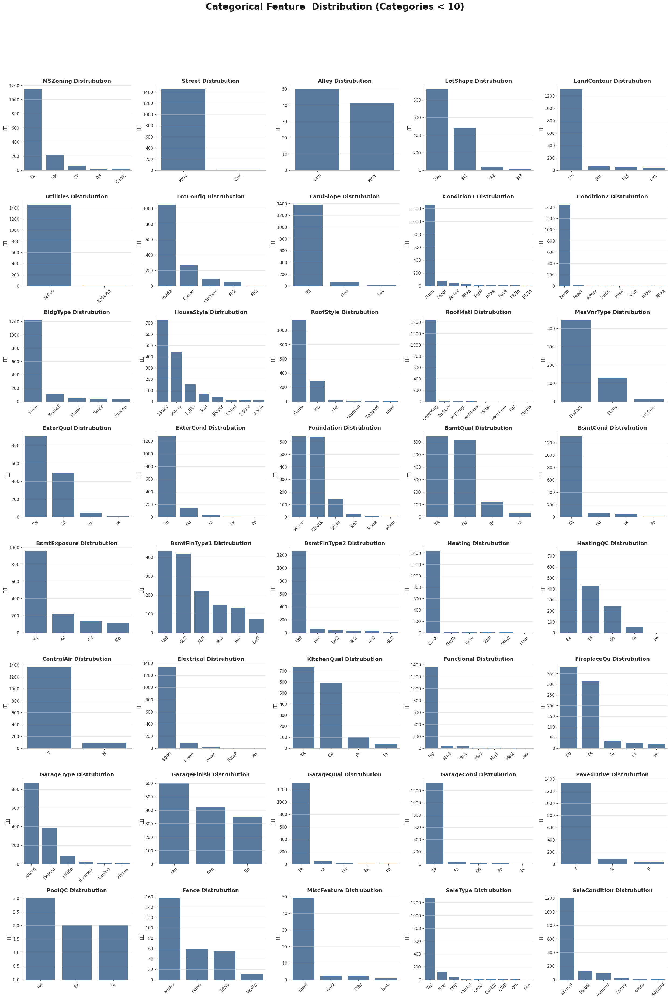


正在生成关键特征关系图...


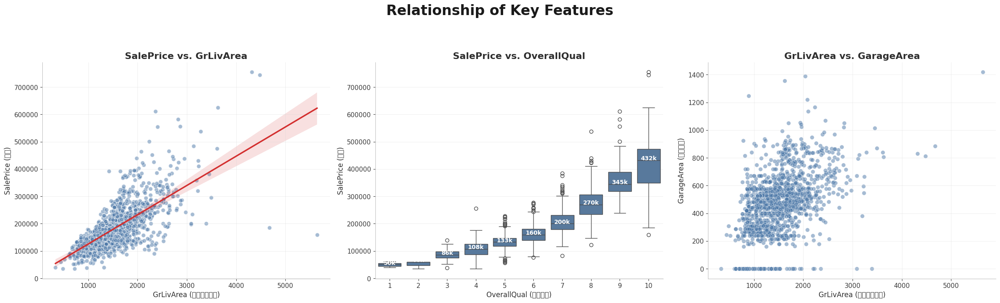


绘图完成，Matplotlib 样式已重置为默认值。


In [11]:
# =============================================================================
# 1. SETUP AND DATA LOADING (已移除模拟数据)
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy.stats import norm, skew

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# --- 文件路径 (请务必修改!) ---
# 注意：请确保这里的路径对您的系统是正确的。
# 代码现在会直接加载这些路径，如果文件不存在将会报错。
train_path = '/home/haoqian/HousePricePrediction/data/train.csv'
test_path = '/home/haoqian/HousePricePrediction/data/test.csv'

try:
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    print("真实数据加载成功。")
except FileNotFoundError:
    print(f"错误：无法在指定路径找到文件。")
    print(f"尝试加载的训练集路径: {train_path}")
    print(f"尝试加载的测试集路径: {test_path}")
    print("请检查文件路径是否正确，然后重新运行脚本。")
    # 如果文件找不到，退出程序以避免后续错误
    exit()

print(f"训练集形状: {df_train.shape}")
print(f"测试集形状: {df_test.shape}")

# 删除ID列
df_train.drop("Id", axis=1, inplace=True, errors='ignore')
df_test.drop("Id", axis=1, inplace=True, errors='ignore')

# =============================================================================
# 2. 特征分类 (您的原始代码)
# =============================================================================
# 识别数值特征 (不包括目标变量 'SalePrice')
numerical_features = df_train.select_dtypes(include=np.number).columns.tolist()
if 'SalePrice' in numerical_features:
    numerical_features.remove('SalePrice')
# 确保 GarageArea 在列表中以便后续绘图
if 'GarageArea' not in numerical_features and 'GarageArea' in df_train.columns:
    numerical_features.append('GarageArea')


# 识别类别特征
categorical_features = df_train.select_dtypes(include='object').columns.tolist()

# 筛选出类别数小于10的类别特征用于绘图
categorical_features_to_plot = [
    col for col in categorical_features if df_train[col].nunique() < 10
]

print(f"\n找到 {len(numerical_features)} 个数值特征。")
print(f"找到 {len(categorical_features)} 个类别特征，其中 {len(categorical_features_to_plot)} 个的唯一值少于10个，将被绘制。")


# =============================================================================
# 3. 美学配置和调色板 (您的原始代码)
# =============================================================================
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#C0C0C0",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#2E2E2E",
    "xtick.color": "#3A3A3A",
    "ytick.color": "#3A3A3A",
    "grid.color": "#D7D7D7",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.5,
    "font.size": 11,
    "font.family": "DejaVu Sans",
})

# 调色板
c_front = "#4C78A8"   # 用于主图元素的去饱和蓝色 (用于所有直方图、条形图和散点)
c_other = "#A9A9A9"   # 用于次要元素的中性灰色
c_line  = "#D32F2F"   # 用于拟合曲线的颜色 (仅用于SalePrice vs GrLivArea)

# 设置中文字体，以防标题乱码 (如果需要)
# plt.rcParams['font.sans-serif'] = ['SimHei'] # 例如：黑体
# plt.rcParams['axes.unicode_minus'] = False # 解决负号显示问题


# =============================================================================
# 4. 绘制数值特征分布图 (您的原始代码)
# =============================================================================
print("\n正在生成数值特征Distrubution图...")

# 确定网格大小
num_plots_num = len(numerical_features)
cols_num = 5
rows_num = math.ceil(num_plots_num / cols_num)

# 创建子图网格
fig_num, axes_num = plt.subplots(rows_num, cols_num, figsize=(25, rows_num * 4.5))
axes_num = axes_num.flatten() if hasattr(axes_num, 'flatten') else np.array([axes_num])

for i, feature in enumerate(numerical_features):
    ax = axes_num[i]
    
    # 绘制直方图和KDE，颜色使用 c_front
    sns.histplot(df_train[feature], kde=True, color=c_front, ax=ax,
                 line_kws={'linewidth': 2, 'color': "#4C78A8"})
    
    # 设置标题和标签
    ax.set_title(f'{feature} Distrubution', fontsize=14, fontweight='bold', color='#2E2E2E')
    ax.set_xlabel("")
    ax.set_ylabel("频数", fontsize=12)
    ax.grid(True)
    sns.despine(ax=ax, left=True, bottom=True)

# 隐藏未使用的子图
for i in range(num_plots_num, len(axes_num)):
    axes_num[i].set_visible(False)

# 添加主标题
fig_num.suptitle('Numerical Featrue Distribution Overview', fontsize=24, fontweight='bold', y=1.03, color='#1A1A1A')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


# =============================================================================
# 5. 绘制类别特征分布图 (您的原始代码)
# =============================================================================
print("\n正在生成类别特征 (类别数 < 10) Distrubution图...")

# 确定网格大小
num_plots_cat = len(categorical_features_to_plot)
cols_cat = 5
rows_cat = math.ceil(num_plots_cat / cols_cat)

# 创建子图网格
fig_cat, axes_cat = plt.subplots(rows_cat, cols_cat, figsize=(25, rows_cat * 4.5))
axes_cat = axes_cat.flatten() if hasattr(axes_cat, 'flatten') else np.array([axes_cat])

for i, feature in enumerate(categorical_features_to_plot):
    ax = axes_cat[i]
    
    # 按频数降序绘制条形图，颜色使用 c_front
    order = df_train[feature].value_counts().index
    sns.countplot(x=feature, data=df_train, ax=ax, color=c_front, order=order)
    
    # 设置标题和标签
    ax.set_title(f'{feature} Distrubution', fontsize=14, fontweight='bold', color='#2E2E2E')
    ax.set_xlabel("")
    ax.set_ylabel("计数", fontsize=12)
    ax.tick_params(axis='x', rotation=45) # 旋转x轴标签以防重叠
    ax.grid(axis='y') # 只显示水平网格线
    sns.despine(ax=ax)

# 隐藏未使用的子图
for i in range(num_plots_cat, len(axes_cat)):
    axes_cat[i].set_visible(False)

# 添加主标题
fig_cat.suptitle('Categorical Feature  Distribution (Categories < 10)', fontsize=24, fontweight='bold', y=1.03, color='#1A1A1A')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


# =============================================================================
# 6. 【更新】绘制关键特征关系图
# =============================================================================
print("\n正在生成关键特征关系图...")

# 创建一个1行3列的子图网格，以容纳新增的图表
fig_scatter, axes_scatter = plt.subplots(1, 3, figsize=(24, 7))

# --- 图一: SalePrice vs. GrLivArea (散点图 + 回归线) ---
ax1 = axes_scatter[0]
sns.regplot(x='GrLivArea', y='SalePrice', data=df_train, ax=ax1,
            scatter_kws={'alpha': 0.5, 'color': c_front, 'edgecolor': 'w', 's': 50},
            line_kws={'color': c_line, 'linewidth': 2.5})
ax1.set_title('SalePrice vs. GrLivArea', fontsize=16, fontweight='bold', color='#2E2E2E')
ax1.set_xlabel('GrLivArea (地上居住面积)', fontsize=12)
ax1.set_ylabel('SalePrice (售价)', fontsize=12)
ax1.grid(True)
sns.despine(ax=ax1)


# --- 图二: SalePrice vs. OverallQual (箱形图) ---
ax2 = axes_scatter[1]
sns.boxplot(x='OverallQual', y='SalePrice', data=df_train, ax=ax2, color=c_front)
ax2.set_title('SalePrice vs. OverallQual', fontsize=16, fontweight='bold', color='#2E2E2E')
ax2.set_xlabel('OverallQual (整体质量)', fontsize=12)
ax2.set_ylabel('SalePrice (售价)', fontsize=12)
medians = df_train.groupby(['OverallQual'])['SalePrice'].median()
for i, median_val in enumerate(medians):
    ax2.text(i, median_val, f'{median_val/1000:.0f}k', 
             horizontalalignment='center', size=10, color='white', weight='semibold')
ax2.grid(axis='y')
sns.despine(ax=ax2)


# --- 图三: GrLivArea vs. GarageArea (纯散点图，无拟合线) ---
ax3 = axes_scatter[2]
sns.scatterplot(x='GrLivArea', y='GarageArea', data=df_train, ax=ax3,
                alpha=0.5, color=c_front, edgecolor='w', s=50)
ax3.set_title('GrLivArea vs. GarageArea', fontsize=16, fontweight='bold', color='#2E2E2E')
ax3.set_xlabel('GrLivArea (地上居住面积)', fontsize=12)
ax3.set_ylabel('GarageArea (车库面积)', fontsize=12)
ax3.grid(True)
sns.despine(ax=ax3)


# 添加主标题并调整布局
fig_scatter.suptitle('Relationship of Key Features', fontsize=24, fontweight='bold', y=1.03, color='#1A1A1A')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


# =============================================================================
# 7. 重置 Matplotlib 样式
# =============================================================================
# 这是一个好习惯，以免影响后续不相关的绘图
plt.rcParams.update(plt.rcParamsDefault)
print("\n绘图完成，Matplotlib 样式已重置为默认值。")

Data loaded successfully.
Training set shape: (1460, 81)
Test set shape: (1459, 80)

Found 36 numerical features.
Found 43 categorical features, of which 40 have < 10 unique values and will be plotted.

Generating numerical feature distribution plots...


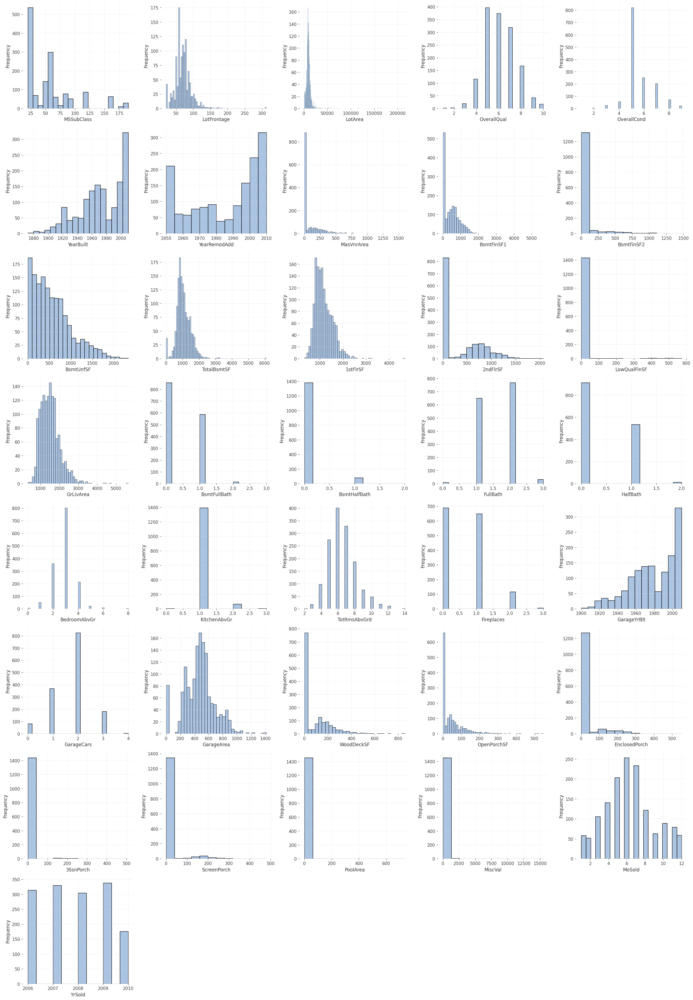


Generating categorical feature distribution plots (for features with < 10 categories)...


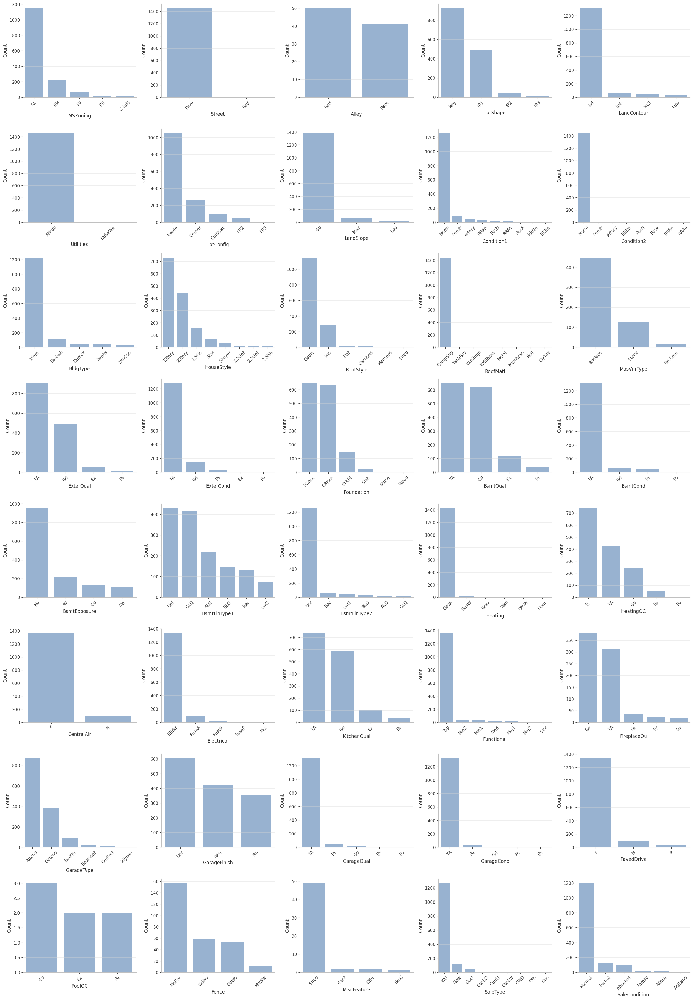


Generating key feature relationship plots...


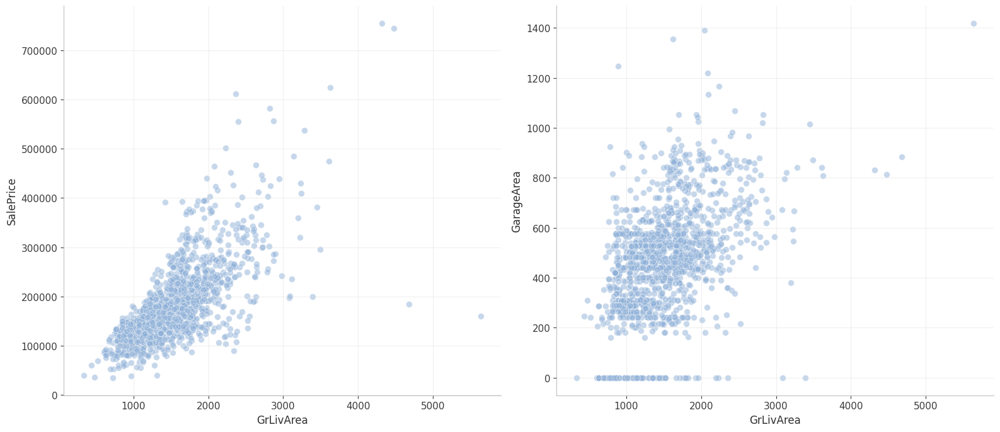


Plotting complete. Matplotlib styles have been reset to default.


In [15]:
# =============================================================================
# 1. SETUP AND DATA LOADING
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy.stats import norm, skew

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# --- File Paths (IMPORTANT: Please modify these) ---
# NOTE: Ensure these paths are correct for your system.
# The script will now fail if the files are not found.
train_path = '/home/haoqian/HousePricePrediction/data/train.csv'
test_path = '/home/haoqian/HousePricePrediction/data/test.csv'

try:
    df_train = pd.read_csv(train_path)
    df_test = pd.read_csv(test_path)
    print("Data loaded successfully.")
except FileNotFoundError:
    print(f"Error: Could not find files at the specified paths.")
    print(f"Attempted train path: {train_path}")
    print(f"Attempted test path: {test_path}")
    print("Please check your file paths and run the script again.")
    exit()

print(f"Training set shape: {df_train.shape}")
print(f"Test set shape: {df_test.shape}")

# Drop the 'Id' column as it is not a feature
df_train.drop("Id", axis=1, inplace=True, errors='ignore')
df_test.drop("Id", axis=1, inplace=True, errors='ignore')

# =============================================================================
# 2. FEATURE CLASSIFICATION
# =============================================================================
# Identify numerical features (excluding the target variable 'SalePrice')
numerical_features = df_train.select_dtypes(include=np.number).columns.tolist()
if 'SalePrice' in numerical_features:
    numerical_features.remove('SalePrice')

# Identify categorical features
categorical_features = df_train.select_dtypes(include='object').columns.tolist()

# Filter for categorical features with fewer than 10 unique values for plotting
categorical_features_to_plot = [
    col for col in categorical_features if df_train[col].nunique() < 10
]

print(f"\nFound {len(numerical_features)} numerical features.")
print(f"Found {len(categorical_features)} categorical features, of which {len(categorical_features_to_plot)} have < 10 unique values and will be plotted.")


# =============================================================================
# 3. AESTHETICS AND COLOR PALETTE
# =============================================================================
# Set global plot styles
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#C0C0C0",
    "axes.linewidth": 0.8,
    "axes.labelcolor": "#2E2E2E",
    "xtick.color": "#3A3A3A",
    "ytick.color": "#3A3A3A",
    "grid.color": "#D7D7D7",
    "grid.linewidth": 0.6,
    "grid.alpha": 0.5,
    "font.size": 11,
    "font.family": "DejaVu Sans",
})

# Color Palette
# This single color will be used for all histograms, bar plots, and scatter plots.
c_front = "#8FB1D9"   # A desaturated blue for primary plot elements

# =============================================================================
# 4. PLOT NUMERICAL FEATURE DISTRIBUTIONS
# =============================================================================
print("\nGenerating numerical feature distribution plots...")

# Determine grid size
num_plots_num = len(numerical_features)
cols_num = 5
rows_num = math.ceil(num_plots_num / cols_num)

# Create subplots grid
fig_num, axes_num = plt.subplots(rows_num, cols_num, figsize=(25, rows_num * 4.5))
axes_num = axes_num.flatten() if hasattr(axes_num, 'flatten') else np.array([axes_num])

for i, feature in enumerate(numerical_features):
    ax = axes_num[i]
    
    # Plot histogram without the KDE line, using the consistent color
    sns.histplot(df_train[feature], kde=False, color=c_front, ax=ax)
    
    # Set labels
    ax.set_xlabel(feature, fontsize=12) # Use feature name as xlabel since there is no title
    ax.set_ylabel("Frequency", fontsize=12)
    ax.grid(True)
    sns.despine(ax=ax, left=True, bottom=True)

# Hide unused subplots
for i in range(num_plots_num, len(axes_num)):
    axes_num[i].set_visible(False)

plt.tight_layout()
plt.show()


# =============================================================================
# 5. PLOT CATEGORICAL FEATURE DISTRIBUTIONS
# =============================================================================
print("\nGenerating categorical feature distribution plots (for features with < 10 categories)...")

# Determine grid size
num_plots_cat = len(categorical_features_to_plot)
cols_cat = 5
rows_cat = math.ceil(num_plots_cat / cols_cat)

# Create subplots grid
fig_cat, axes_cat = plt.subplots(rows_cat, cols_cat, figsize=(25, rows_cat * 4.5))
axes_cat = axes_cat.flatten() if hasattr(axes_cat, 'flatten') else np.array([axes_cat])

for i, feature in enumerate(categorical_features_to_plot):
    ax = axes_cat[i]
    
    # Plot countplot, ordered by frequency, using the same color as numerical plots
    order = df_train[feature].value_counts().index
    sns.countplot(x=feature, data=df_train, ax=ax, color=c_front, order=order)
    
    # Set labels
    ax.set_xlabel(feature, fontsize=12) # Use feature name as xlabel
    ax.set_ylabel("Count", fontsize=12)
    ax.tick_params(axis='x', rotation=45) # Rotate x-axis labels to prevent overlap
    ax.grid(axis='y') # Show horizontal grid lines only
    sns.despine(ax=ax)

# Hide unused subplots
for i in range(num_plots_cat, len(axes_cat)):
    axes_cat[i].set_visible(False)

plt.tight_layout()
plt.show()


# =============================================================================
# 6. PLOT KEY FEATURE RELATIONSHIPS (UPDATED)
# =============================================================================
print("\nGenerating key feature relationship plots...")

# Create a 1-row, 2-column subplot grid
fig_scatter, axes_scatter = plt.subplots(1, 2, figsize=(16, 7))

# --- Plot 1: SalePrice vs. GrLivArea (Scatter plot only) ---
ax1 = axes_scatter[0]
# Use scatterplot instead of regplot to remove the regression line
sns.scatterplot(x='GrLivArea', y='SalePrice', data=df_train, ax=ax1,
                alpha=0.5, color=c_front, edgecolor='w', s=50)
ax1.set_xlabel('GrLivArea', fontsize=12)
ax1.set_ylabel('SalePrice', fontsize=12)
ax1.grid(True)
sns.despine(ax=ax1)


# --- Plot 2: GrLivArea vs. GarageArea (Scatter plot only) ---
ax2 = axes_scatter[1]
sns.scatterplot(x='GrLivArea', y='GarageArea', data=df_train, ax=ax2,
                alpha=0.5, color=c_front, edgecolor='w', s=50)
ax2.set_xlabel('GrLivArea', fontsize=12)
ax2.set_ylabel('GarageArea', fontsize=12)
ax2.grid(True)
sns.despine(ax=ax2)


# Adjust layout
plt.tight_layout()
plt.show()


# =============================================================================
# 7. RESET MATPLOTLIB STYLE
# =============================================================================
# It's good practice to reset styles so they don't affect other plots in the same session
plt.rcParams.update(plt.rcParamsDefault)
print("\nPlotting complete. Matplotlib styles have been reset to default.")

正在导入库...
数据加载成功。数据集大小: (1460, 81)
正在生成散点图...


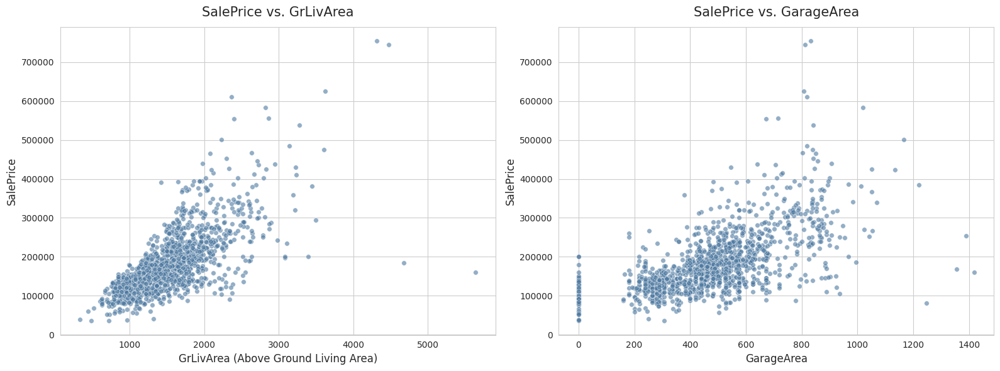

绘图完成。


In [1]:
# =============================================================================
# 1. 导入所需库
# =============================================================================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("正在导入库...")

# =============================================================================
# 2. 加载数据
# =============================================================================
# --- 文件路径 (重要：请根据您的文件位置修改此路径) ---
train_path = '/home/haoqian/HousePricePrediction/data/train.csv'  # <--- 请将 'train.csv' 替换为您的实际文件路径

try:
    df_train = pd.read_csv(train_path)
    print(f"数据加载成功。数据集大小: {df_train.shape}")
except FileNotFoundError:
    print(f"错误：在指定路径找不到文件。")
    print(f"尝试的路径: {train_path}")
    print("请检查文件路径是否正确，然后重新运行脚本。")
    # 如果找不到文件，则退出程序
    exit()

# =============================================================================
# 3. 设置绘图样式
# =============================================================================
# 设置Seaborn的样式以匹配参考图像（白色背景，灰色网格）
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DejaVu Sans' # 设置一个通用的无衬线字体
plt.rcParams['figure.dpi'] = 100 # 提高图像分辨率

# =============================================================================
# 4. 绘制散点图
# =============================================================================
print("正在生成散点图...")

# 创建一个1行2列的子图网格，用于并排显示两个图表
# figsize=(16, 6) 设置整个画布的大小（宽度16英寸，高度6英寸）
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- 图1: SalePrice vs. GrLivArea (左侧图) ---
ax1 = axes[0]
sns.scatterplot(
    x='GrLivArea', 
    y='SalePrice', 
    data=df_train, 
    ax=ax1,
    color='#4C78A0',  # 使用经典的 desaturated blue
    alpha=0.6,        # 设置透明度以显示数据密度
    s=30,             # 设置散点的大小
    edgecolor='w',    # 给散点添加一个细微的白色描边
    linewidth=0.5
)
ax1.set_title('SalePrice vs. GrLivArea', fontsize=15, pad=12)
ax1.set_xlabel('GrLivArea (Above Ground Living Area)', fontsize=12)
ax1.set_ylabel('SalePrice', fontsize=12)

# --- 图2: SalePrice vs. GarageArea (右侧图) ---
ax2 = axes[1]
sns.scatterplot(
    x='GarageArea', 
    y='SalePrice', 
    data=df_train, 
    ax=ax2,
    color='#4C78A0',
    alpha=0.6,
    s=30,
    edgecolor='w',
    linewidth=0.5
)
ax2.set_title('SalePrice vs. GarageArea', fontsize=15, pad=12)
ax2.set_xlabel('GarageArea', fontsize=12)
ax2.set_ylabel('SalePrice', fontsize=12)

# 移除y轴标签以避免与左图重复，使布局更简洁
# ax2.set_ylabel('') # 如果不想要右图的Y轴标签，可以取消此行注释

# =============================================================================
# 5. 显示最终图像
# =============================================================================
# 自动调整子图布局，防止标题和标签重叠
plt.tight_layout()

# 显示图像
plt.show()

print("绘图完成。")